### IMPORTY:

In [2]:
%matplotlib inline
import numpy as np
from scipy.stats import pearsonr
import scipy.signal as ss
import scipy.stats as scst
import saffy
from saffy.generators.svarog import svarog
import matplotlib.pyplot as plt
import matplotlib as mpl
from scipy import signal
import csv
import time
import progressbar

In [3]:
import mtmvar

### Czytanie, montowanie i obróbka sygnałów.

2020-02-07 13:01:07,809 - data_source - INFO - All data set requested for the first time. Start reading all data from the file...


22


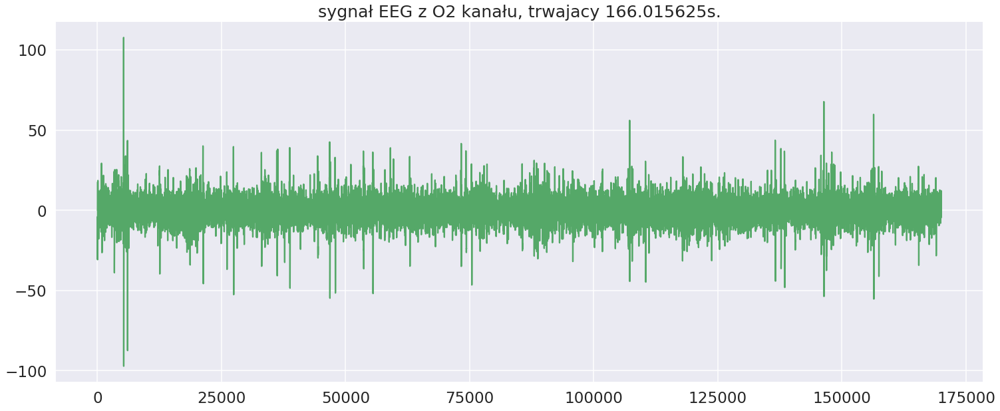

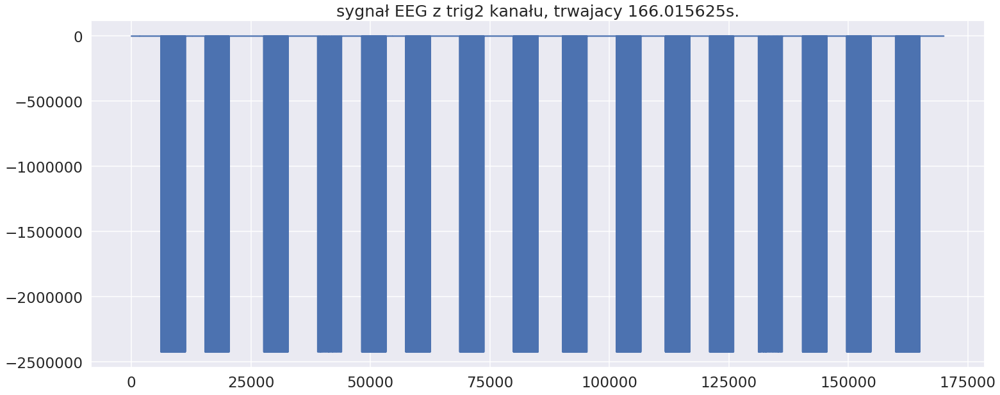

rozmiar naszej macierzy z sygnałami (liczba kanałów , liczba próbek) = (22, 1572960) 
Fs:  1024


In [4]:
pliki = {1:'Mateuszek_1', 2:'Mateuszek_2'}
fig = plt.figure(figsize = (25,10))

EEG = saffy.SignalManager(generator=svarog(pliki[1]))

CH = ['O1','O2','T5','P3','Pz','P4','T6','T3','C3','Cz','C4','T4','F7','F3','Fz','F4','F8','Fp1','Fp2','ref','trig1','trig2'] 
EEG.extract_channels(CH)
print(len(CH))


EEG.data[0,:-2,:] = EEG.data[0,:-2,:] - EEG.data[0,-3,:]
triggery = EEG.data[0,-2:,:]
EEG.butter_bandpass_filter(lowcut=4, highcut=45, order=2)
EEG.cheb2_notch_filter(cutoff=50, order=1, rs=3, width=.1, method=None, btype='bandstop')
EEG.data[0,-2:,:] = triggery


EEG_2D = EEG.data[0,:,:] #jest tylko jeden zestaw danych

Fs = EEG.fs
CH_N = EEG_2D.shape[0]
kanał = 1 
kanał2 = -1
próbki = int(170000)
pstart = int(0)


plt.plot(EEG_2D[kanał,pstart:próbki], color = 'g')
plt.title(f"sygnał EEG z {CH[kanał]} kanału, trwajacy {próbki/Fs}s.")
plt.show()
fig = plt.figure(figsize = (25,10))
plt.plot(EEG_2D[kanał2,pstart:próbki]-EEG_2D[-2,pstart:próbki])
plt.title(f"sygnał EEG z {CH[kanał2]} kanału, trwajacy {próbki/Fs}s.")
plt.show()
print(f"rozmiar naszej macierzy z sygnałami (liczba kanałów , liczba próbek) = {EEG_2D.data.shape} ")
print('Fs: ', Fs)

2020-02-07 13:01:50,712 - data_source - INFO - All data set requested for the first time. Start reading all data from the file...


22


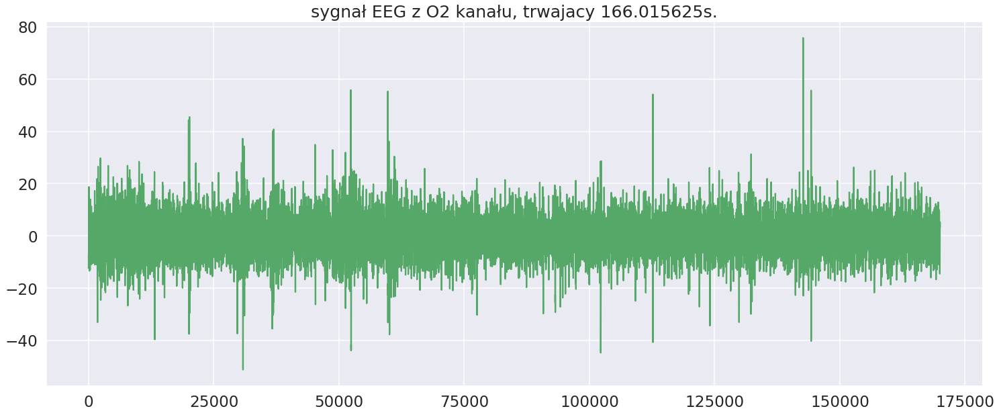

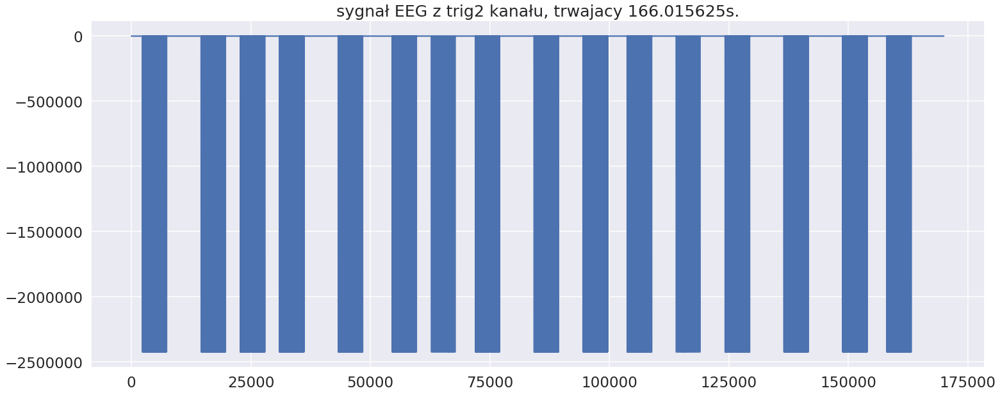

rozmiar naszej macierzy z sygnałami (liczba kanałów , liczba próbek) = (22, 1572768) 
Fs:  1024


In [5]:
fig = plt.figure(figsize = (25,10))

EEG2 = saffy.SignalManager(generator=svarog(pliki[2]))

CH = ['O1','O2','T5','P3','Pz','P4','T6','T3','C3','Cz','C4','T4','F7','F3','Fz','F4','F8','Fp1','Fp2','ref','trig1','trig2'] 
EEG2.extract_channels(CH)
print(len(CH))


EEG2.data[0,:-2,:] = EEG2.data[0,:-2,:] - EEG2.data[0,-3,:]
triggery = EEG2.data[0,-2:,:]
EEG2.butter_bandpass_filter(lowcut=4, highcut=45, order=2)
EEG2.cheb2_notch_filter(cutoff=50, order=1, rs=3, width=.1, method=None, btype='bandstop')
EEG2.data[0,-2:,:] = triggery


EEG2_2D = EEG2.data[0,:,:] #jest tylko jeden zestaw danych

Fs = EEG2.fs
CH_N = EEG2_2D.shape[0]
kanał = 1 
kanał2 = -1
próbki = int(170000)
pstart = int(0)


plt.plot(EEG2_2D[kanał,pstart:próbki], color = 'g')
plt.title(f"sygnał EEG z {CH[kanał]} kanału, trwajacy {próbki/Fs}s.")
plt.show()
fig = plt.figure(figsize = (25,10))
plt.plot(EEG2_2D[kanał2,pstart:próbki]-EEG2_2D[-2,pstart:próbki])
plt.title(f"sygnał EEG z {CH[kanał2]} kanału, trwajacy {próbki/Fs}s.")
plt.show()
print(f"rozmiar naszej macierzy z sygnałami (liczba kanałów , liczba próbek) = {EEG2_2D.data.shape} ")
print('Fs: ', Fs)

In [6]:
EEG.data = np.concatenate((EEG.data , EEG2.data), axis=2)


In [7]:
EEG.data.shape

(1, 22, 3145728)

In [8]:
EEG2.data.shape

(1, 22, 1572768)

### Cięcie na epoki(?) sygnału

In [9]:
trigger_index = -2
print(f'EEG Data: {EEG.data.shape}')
start = -0.3
stop = 0.6


okno = np.zeros(Fs)
trigger_values =  EEG.data[0, trigger_index, :].copy()
baseline = 1.1*np.mean(trigger_values[0:Fs])
baseline10 = 10*baseline
peaks = []
trg_values = []
i = 0
while i < len(trigger_values)-1:
    if trigger_values[i+1] > 5*trigger_values[i]:
        peaks.append(i)
        trg_values.append(trigger_values[i])
        i = i + Fs*5
    i += 1
        
print(f'Peaks count: {len(peaks)}')
fragments = np.zeros((len(peaks), 22, int(Fs*5)))
fragments.shape

# plt.figure(figsize=(16,4))
# plt.plot(EEG.data[0, trigger_index, :])
# plt.plot(peaks, EEG.data[0, trigger_index, peaks], "x")
# plt.xlim(((7+5)*Fs, (16+5)*Fs))
# plt.show()

for i, peak in enumerate(peaks):
    fragments[i,:,:] = EEG.data[0, :, int(peak):int(peak+Fs*5)]
print(f'fragments: {fragments.shape}')



EEG Data: (1, 22, 3145728)
Peaks count: 300
fragments: (300, 22, 5120)


### Do Hilberta

In [62]:
fragments_4H = np.zeros((len(peaks), 22, int(Fs*9)))
for i, peak in enumerate(peaks):
    fragments_4H[i,:,:] = EEG.data[0, :, int(peak)-Fs*2:int(peak+Fs*7)]
print(f'fragments4H: {fragments_4H.shape}')

fragments4H: (300, 22, 9216)


### Zabawa pochodnymi

In [9]:
#Zabawa pochodnymi

# plt.figure(figsize=(16,4))
# plt.xlim(((7+5)*Fs, (16+5)*Fs))
# plt.plot(np.diff(EEG.data[0, trigger_index, :]))

# kanal = np.diff(EEG.data[0, trigger_index, :])
# peaks, _ = ss.find_peaks(kanal, height=1000000,distance = 6*Fs)
# plt.plot(peaks, EEG.data[0, trigger_index, peaks], "x")
# plt.show()

In [10]:
# for i, fragment in enumerate(fragments):
# #     plt.plot(fragment[0,:])
# #     plt.show()
#     fft = np.abs(np.fft.rfft(fragment[0,:]))
#     freq = np.fft.rfftfreq(len(fragment[0,:]), 1/Fs)
#     plt.plot(freq, fft)
#     plt.xlim(0, 50)
#     plt.show()
#     print(i+1, freq[np.argmax(fft)])

### Sortowanie epok po częstościach błyskania

In [64]:
real_freqs = []
with open('kolejnosc_wspolna.csv') as csv_file:
    reader = csv.DictReader(csv_file, delimiter=',')
    for row in reader:
        real_freqs.append(int(row['Częstość']))
        
real_freqs = np.array(real_freqs)
ind = np.argsort(real_freqs, axis=0)
# print(real_freqs[ind])

In [11]:
sorted_fragments = fragments[ind]
print(f'sorted_fragments: {sorted_fragments.shape}')
sorted_reshaped_fragments = sorted_fragments.reshape(10,30,sorted_fragments.shape[1],sorted_fragments.shape[2])
print(f'sorted_reshaped_fragments: {sorted_reshaped_fragments.shape}')

sorted_fragments: (300, 22, 5120)
sorted_reshaped_fragments: (10, 30, 22, 5120)


### Do Hilberta

In [65]:
sorted_fragments_4H = fragments_4H[ind]
print(f'sorted_fragments_4H: {sorted_fragments_4H.shape}')
sorted_reshaped_fragments_4H = sorted_fragments_4H.reshape(10,30,sorted_fragments_4H.shape[1],sorted_fragments_4H.shape[2])
print(f'sorted_reshaped_fragments_4H: {sorted_reshaped_fragments_4H.shape}')

sorted_fragments_4H: (300, 22, 9216)
sorted_reshaped_fragments_4H: (10, 30, 22, 9216)


In [13]:
spectrum_fragments = np.abs(np.fft.rfft(sorted_reshaped_fragments))
spectrum_fragments = np.mean(spectrum_fragments, axis = 1)
print(f'spectrum_fragments: {spectrum_fragments.shape}')
freq = np.fft.rfftfreq(sorted_reshaped_fragments.shape[-1], 1/Fs)

spectrum_fragments: (10, 22, 2561)


In [153]:
# for i, fragment in enumerate(sorted_fragments):
# #     plt.plot(fragment[0,:])
# #     plt.show()
#     fft = np.abs(np.fft.rfft(fragment[0,:]))
#     freq = np.fft.rfftfreq(len(fragment[0,:]), 1/Fs)
#     plt.plot(freq, fft)
#     plt.xlim(0, 50)
#     plt.show()
#     print(i+1, freq[np.argmax(fft)])
    

# Analiza - Sposób 1 
### Rysowanie uśrednionych widm

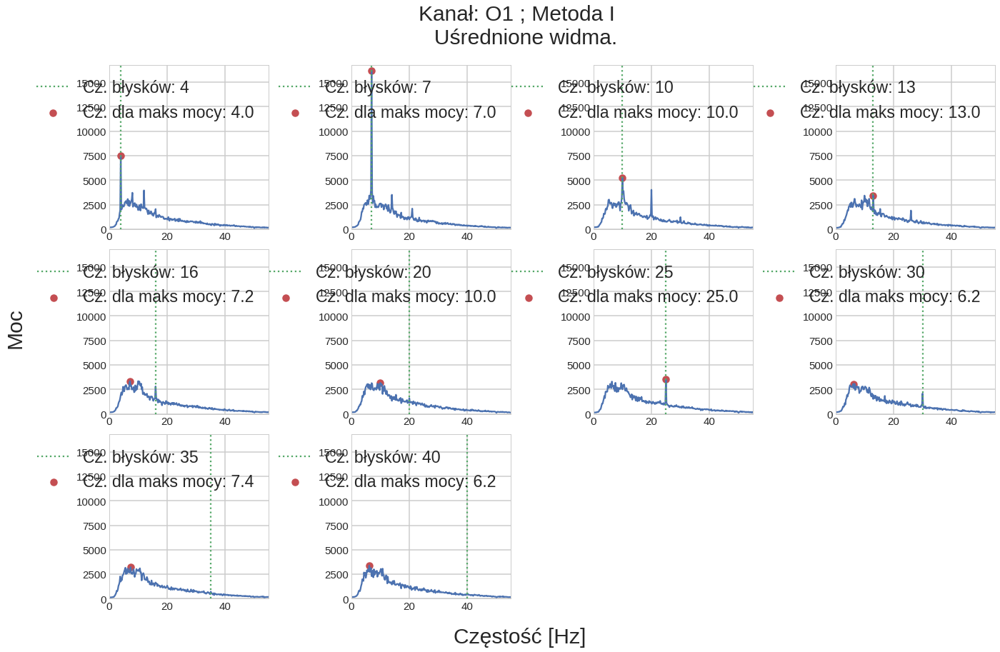

In [14]:
# import matplotlib.axes
import matplotlib as mpl
mpl.style.use('seaborn-whitegrid')
for ch, ch_name in enumerate(CH[:1]):
    fig = plt.figure(figsize = (20,17))
    fig.text(0.5, 0.25, 'Częstość [Hz]', ha='center',fontsize=30)
    fig.text(0, 0.61, 'Moc', va='center', rotation='vertical',fontsize=30)
    plt.rc('axes', labelsize=16)
    plt.rc('axes', titlesize=18) 
    plt.rc('xtick', labelsize=15)    # fontsize of the tick labels
    plt.rc('ytick', labelsize=15) 
#     plt.yticks(np.arange(0, 1, step=0.1))
    fig.suptitle(f'Kanał: {ch_name} ; Metoda I \n  Uśrednione widma.', fontsize=30)
    for i, fragment in enumerate(spectrum_fragments[:,ch]):
        plt.subplot(4,4,i+1)
        plt.plot(freq, fragment)
        plt.xlim(0, 55)
        plt.ylim(0,16800)
        plt.scatter(freq[np.where(fragment == np.max(fragment))[0]], np.max(fragment) , color = 'r',label = f'Cz. dla maks mocy: {round(freq[np.argmax(fragment)],2)}')

        plt.axvline(real_freqs[ind].reshape(10,30)[i][0], ls = ':', color = 'g',label = f'Cz. błysków: {real_freqs[ind].reshape(10,30)[i][0]}')
#         plt.title(f'max cz: {round(freq[np.argmax(fragment)],2)} , cz. bł.: {real_freqs[ind].reshape(10,30)[i][0]}')
#         plt.xlabel('Częstość [Hz]')
#         plt.ylabel('Moc') # [$\mu$V$^2$]
        plt.legend()
#     matplotlib.axes.Axes.ticklabel_format(style = "sci")
        #     print(i+1, freq[np.argmax(fragment)])
    fig.tight_layout(rect=[0.03, 0.08, 0.97, 0.92])
plt.show()


### Statystyka dla każdej częstości - przedziały ufności + bootstrap(?)

Dla każdej częstości stymulacji wyznacz miarę odpowiedzi SSVEP (amplitudę widma odpowiadającą częstości stymulacji) wraz z 95% przedziałem ufności dla średniej. Można to zrobić np. metodą bootstrap. Dla każdej częstości stymulacji wyznacz także poziom tła na podstawie widm pochodzących ze stymulacji innymi częstościami. Np. dla stymulacji częstością 10 Hz poziom tła można wyznaczyć jako 95 centyl ze zbioru wartości widma w częstości 10 Hz dla stymulacji częstościami {4, 7, 13, 16, 20, 25, 30, 35, 40} Hz. 

In [48]:
czestosci =  (4, 7, 10, 13, 16, 20, 25, 30, 35, 40)
channel=0
# numer_czestosci = 0
N = 1000
rozklad = np.zeros((len(czestosci),N))
for numer_czestosci in progressbar.progressbar(range(len(czestosci))):
    for i in progressbar.progressbar(range(N)):
        losowe_ind = np.random.randint(30,size=30)
        losowe = sorted_reshaped_fragments[numer_czestosci,losowe_ind,channel,:]
        spec_losowe = np.abs(np.fft.rfft(losowe))
        spec_losowe_mean = np.mean(spec_losowe, axis = 0)
        freq = np.fft.rfftfreq(losowe.shape[-1], 1/Fs)
        ind_cz = int((spec_losowe_mean.shape[-1]/(Fs//2))*czestosci[numer_czestosci])
        rozklad[numer_czestosci,i] = spec_losowe_mean[ind_cz]

#     plt.hist(rozklad[numer_czestosci],bins =30)
#     plt.show()




100% (1000 of 1000) |####################| Elapsed Time: 0:00:02 Time:  0:00:02
100% (1000 of 1000) |####################| Elapsed Time: 0:00:02 Time:  0:00:02
100% (1000 of 1000) |####################| Elapsed Time: 0:00:02 Time:  0:00:02
100% (1000 of 1000) |####################| Elapsed Time: 0:00:02 Time:  0:00:02
100% (1000 of 1000) |####################| Elapsed Time: 0:00:02 Time:  0:00:02
100% (1000 of 1000) |####################| Elapsed Time: 0:00:02 Time:  0:00:02
100% (1000 of 1000) |####################| Elapsed Time: 0:00:02 Time:  0:00:02
100% (1000 of 1000) |####################| Elapsed Time: 0:00:02 Time:  0:00:02
100% (1000 of 1000) |####################| Elapsed Time: 0:00:02 Time:  0:00:02
100% (1000 of 1000) |####################| Elapsed Time: 0:00:02 Time:  0:00:02
100% (10 of 10) |########################| Elapsed Time: 0:00:23 Time:  0:00:23


In [14]:
czestosci =  (4, 7, 10, 13, 16, 20, 25, 30, 35, 40)

In [16]:
np.save("rozklad", rozklad)

NameError: name 'rozklad' is not defined

In [50]:
counter = 0
N = 1000
rozklad2 = np.zeros((len(czestosci),N))
for numer_czestosci in progressbar.progressbar(range(len(czestosci))):
    fragmenty=np.delete(sorted_reshaped_fragments.copy(), numer_czestosci, axis=0)
    for i in progressbar.progressbar(range(N)):
        losowe_ind = np.random.randint(30,size=30)
        losowe = fragmenty[:,losowe_ind,channel,:]
        spec_losowe = np.abs(np.fft.rfft(losowe))
        spec_losowe_mean = np.mean(spec_losowe, axis = (0,1))
        freq = np.fft.rfftfreq(losowe.shape[-1], 1/Fs)
        ind_cz = int((spec_losowe_mean.shape[-1]/(Fs//2))*czestosci[numer_czestosci])
        rozklad2[numer_czestosci,i] = spec_losowe_mean[ind_cz]
        counter += 1


100% (1000 of 1000) |####################| Elapsed Time: 0:00:24 Time:  0:00:24
100% (1000 of 1000) |####################| Elapsed Time: 0:00:24 Time:  0:00:24
100% (1000 of 1000) |####################| Elapsed Time: 0:00:24 Time:  0:00:24
100% (1000 of 1000) |####################| Elapsed Time: 0:00:24 Time:  0:00:24
100% (1000 of 1000) |####################| Elapsed Time: 0:00:25 Time:  0:00:25
100% (1000 of 1000) |####################| Elapsed Time: 0:00:25 Time:  0:00:25
100% (1000 of 1000) |####################| Elapsed Time: 0:00:24 Time:  0:00:24
100% (1000 of 1000) |####################| Elapsed Time: 0:00:24 Time:  0:00:24
100% (1000 of 1000) |####################| Elapsed Time: 0:00:24 Time:  0:00:24
100% (1000 of 1000) |####################| Elapsed Time: 0:00:24 Time:  0:00:24
100% (10 of 10) |########################| Elapsed Time: 0:04:06 Time:  0:04:06


In [51]:
np.save('rozklad2', rozklad2)

In [17]:
rozklad2 = np.load('rozklad2.npy')
rozklad = np.load('rozklad.npy')

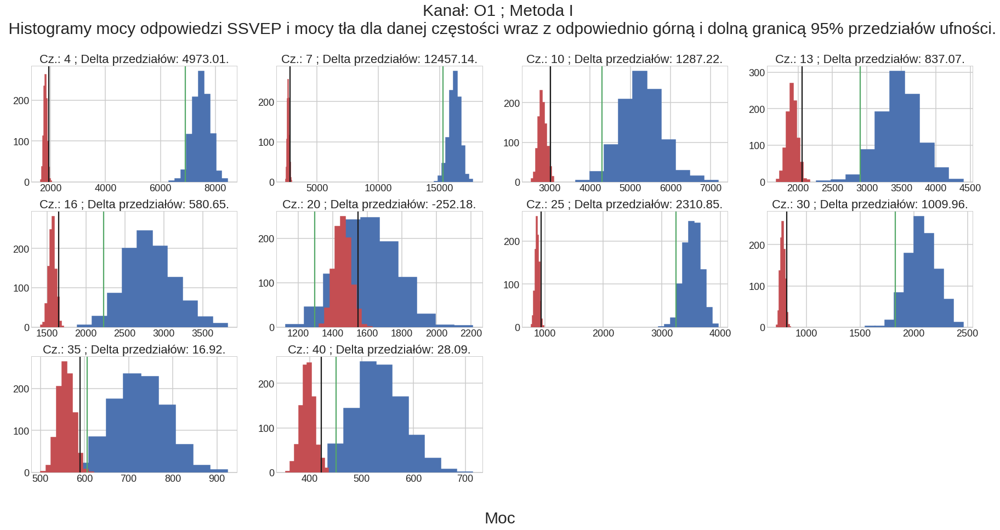

In [18]:
channel=0
# fig.suptitle(f'Channel: {CH[channel]}', fontsize=40)
# fig = plt.figure(figsize=(32,17))

# plt.rc('axes', titlesize=25)     # fontsize of the axes title
# plt.rc('axes', labelsize=20)
fig = plt.figure(figsize = (25,14))
plt.rc('axes', labelsize=16)
plt.rc('axes', titlesize=22) 
plt.rc('xtick', labelsize=18)    # fontsize of the tick labels
plt.rc('ytick', labelsize=18) 
fig.text(0.5, 0.04, 'Moc', ha='center',fontsize=30)
fig.suptitle(f'Kanał: {CH[channel]} ; Metoda I \n Histogramy mocy odpowiedzi SSVEP i mocy tła dla danej częstości wraz z odpowiednio górną i dolną granicą 95% przedziałów ufności.', fontsize=30)
for i in range(len(rozklad)):
    plt.subplot(3,4,i+1)
#     plt.xlabel('Moc')
#     plt.rc('font', size=6)
    cent1 = np.percentile(rozklad[i], 2.5)
    cent2 = np.percentile(rozklad2[i], 97.5)
    plt.title(f'Cz.: {czestosci[i]} ; Delta przedziałów: {round(cent1-cent2,2)}.')
    plt.axvline(cent1, color = 'g')
    plt.axvline(cent2, color = 'k')
#     print(f'Różnica między centylami: {round(cent1-cent2,2)}')
    plt.hist(rozklad[i], color = 'b', edgecolor='b')
    plt.hist(rozklad2[i], color = 'r', edgecolor='r') 
fig.tight_layout(rect=[0, 0.1, 1, 0.9])
plt.show()

wykres odpowiedzi SSVEP od częstości z zaznaczeniem przedziałów ufności i poziomu tła. Znajdź częstości, dla których odpowiedź ta była najsilniejsza.

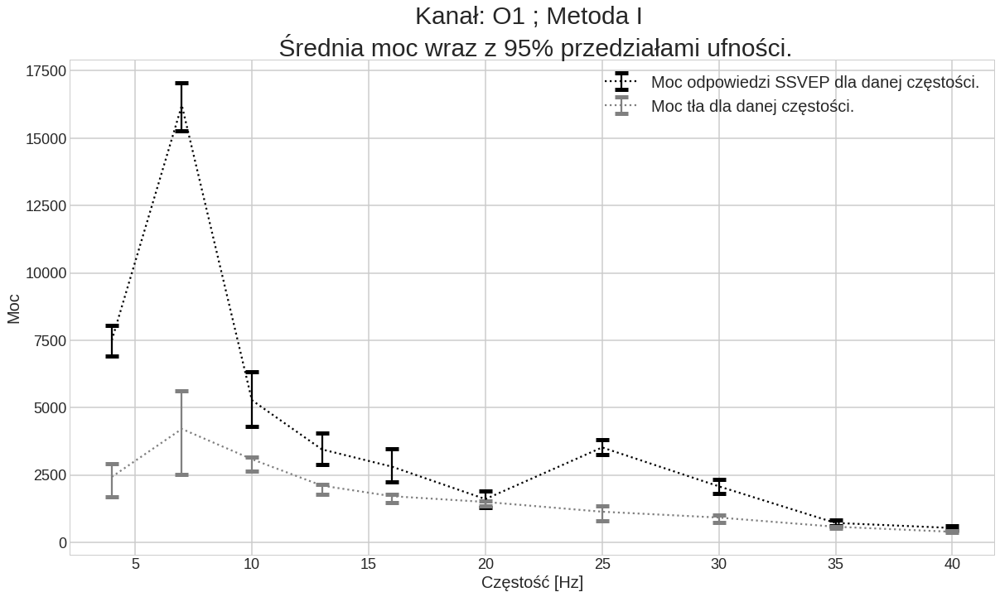

In [19]:
ch, ch_name = (0, 'O1')
plt.figure(figsize = (20,11))
# plt.suptitle(f'', fontsize=40)
czestosci = np.array(czestosci)
ind=len(np.fft.rfft(sorted_reshaped_fragments[2,5,2,:]))
ind_cz = ((ind/(Fs//2))*czestosci).astype(int)
plt.rc('axes', labelsize=20)
plt.rc('axes', titlesize=30) 
plt.rc('xtick', labelsize=18)    # fontsize of the tick labels
plt.rc('ytick', labelsize=18) 
numerki = np.arange(0,10,1)
cent1a = []
cent1b = []
cent2a = []
cent2b = []

for i in numerki:
    cent1a.append(np.percentile(rozklad[i], 2.5))
    cent1b.append(np.percentile(rozklad[i], 97.5))
    cent2a.append(np.percentile(rozklad2[i], 2.5))
    cent2b.append(np.percentile(rozklad2[i], 97.5))
    
for numer_czestosci in range(len(czestosci)):
    fragmenty=np.delete(spectrum_fragments.copy(), numer_czestosci, axis=0)
fragmenty = np.mean(fragmenty, axis=0)
    
y1 = spectrum_fragments[numerki,0,ind_cz]
cent1a = np.absolute(y1 - np.array(cent1a))
cent1b = np.absolute(y1 - np.array(cent1b))
y2 = fragmenty[0,ind_cz]
cent2a = np.absolute(y2 - np.array(cent2a))
cent2b = np.absolute(y2 - np.array(cent2b))

plt.rc('legend', fontsize=20) 
plt.rc('axes', titlesize=30) 
plt.title(f"Kanał: {ch_name} ; Metoda I \n Średnia moc wraz z 95% przedziałami ufności.")
plt.errorbar(czestosci, y1, yerr = (cent1a, cent1b), capsize =8, ls = ':', capthick = 5,color='black',label = "Moc odpowiedzi SSVEP dla danej częstości.")
plt.errorbar(czestosci, y2, yerr = (cent2a, cent2b), capsize =8, ls = ':', capthick = 5,color='grey',label = 'Moc tła dla danej częstości.')
plt.xlabel("Częstość [Hz]")
plt.ylabel("Moc")
fig.tight_layout(rect=[0, 0.05, 1, 0.95])
plt.legend()
plt.show()

### Analiza Sposób II:


*    Uśrednij sygnały odpowiadające stymulacji tą samą częstością.
*     Obejrzyj uśrednione sygnały. (Zaprezentuj je).
*     Wyestymuj przy pomocy transformaty Fouriera widmo amplitudowe średniego sygnału EEG.
*    Dla każdej częstości stymulacji wyznacz miarę odpowiedzi SSVEP wraz z 95% przedziałem ufności dla średniej. Dla każdej częstości stymulacji wyznacz także poziom tła.
*    Sporządź wykres odpowiedzi SSVEP od częstości. Znajdź częstości, dla których odpowiedź ta była najsilniejsza.

In [28]:
signal_mean = np.mean(sorted_reshaped_fragments.copy(), axis = 1)
signal_mean.shape

(10, 22, 5120)

In [29]:
spectrum_fragments_mean_signal = np.abs(np.fft.rfft(signal_mean))
print(f'spectrum_fragments: {spectrum_fragments_mean_signal.shape}')
freq_mean = np.fft.rfftfreq(signal_mean.shape[-1], 1/Fs)

spectrum_fragments: (10, 22, 2561)


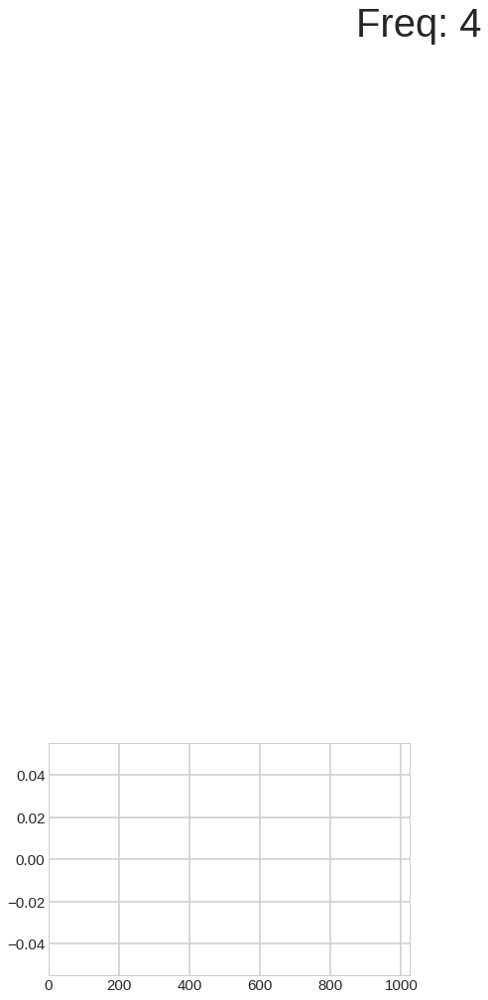

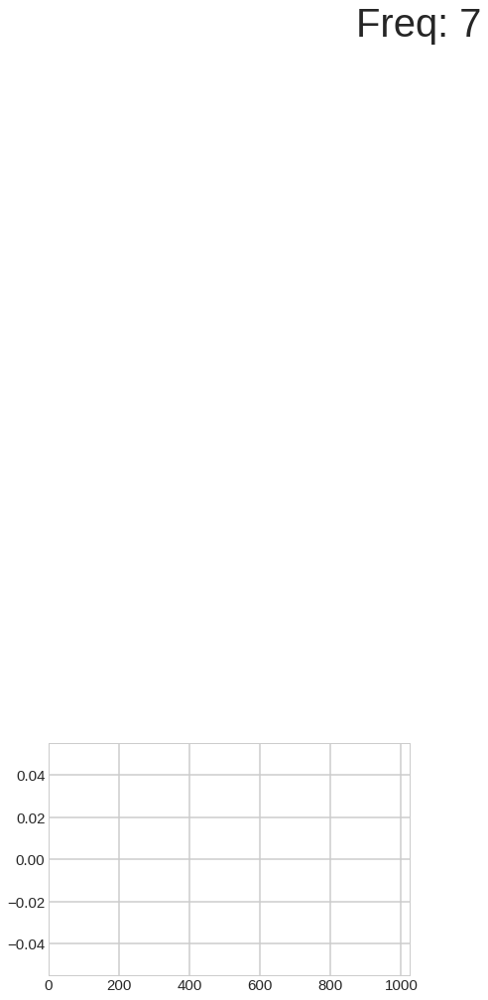

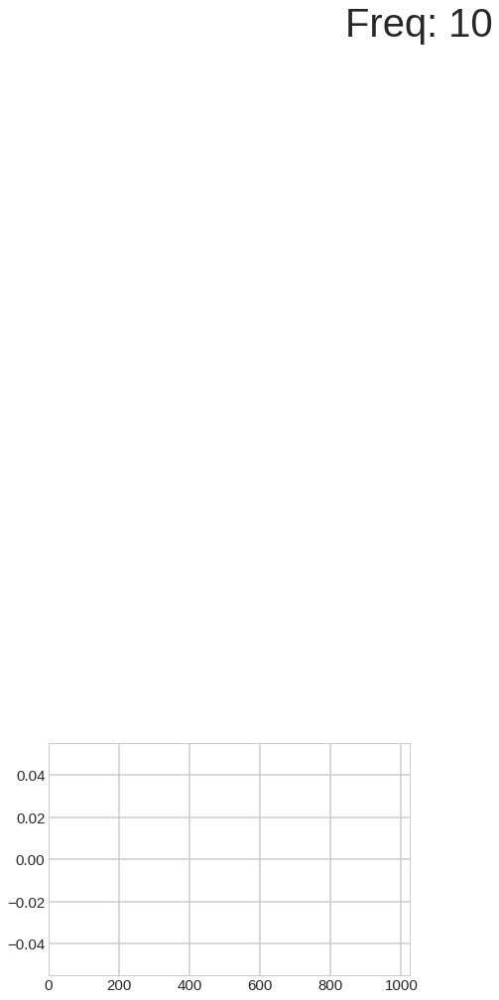

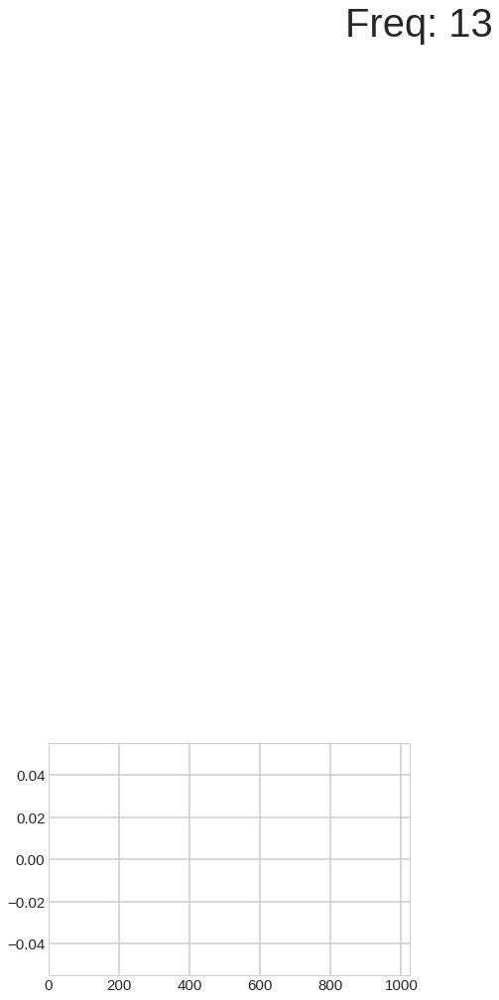

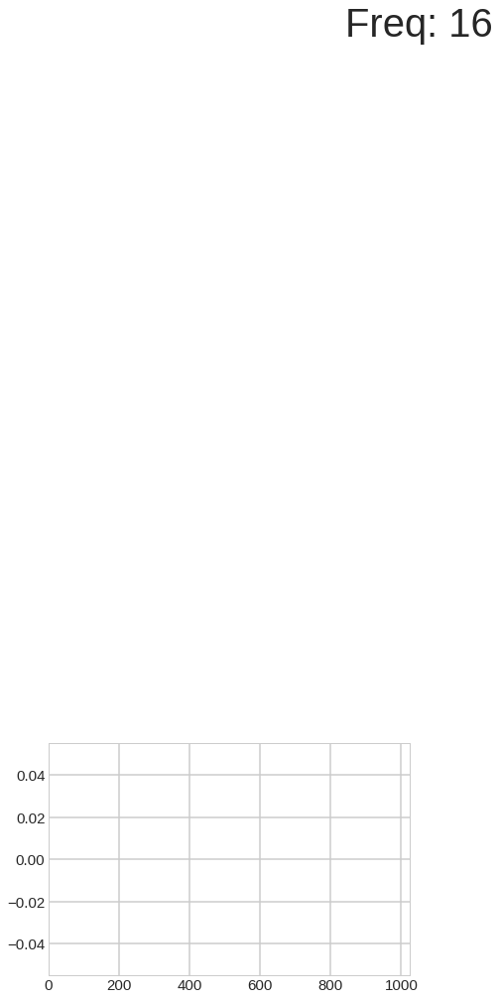

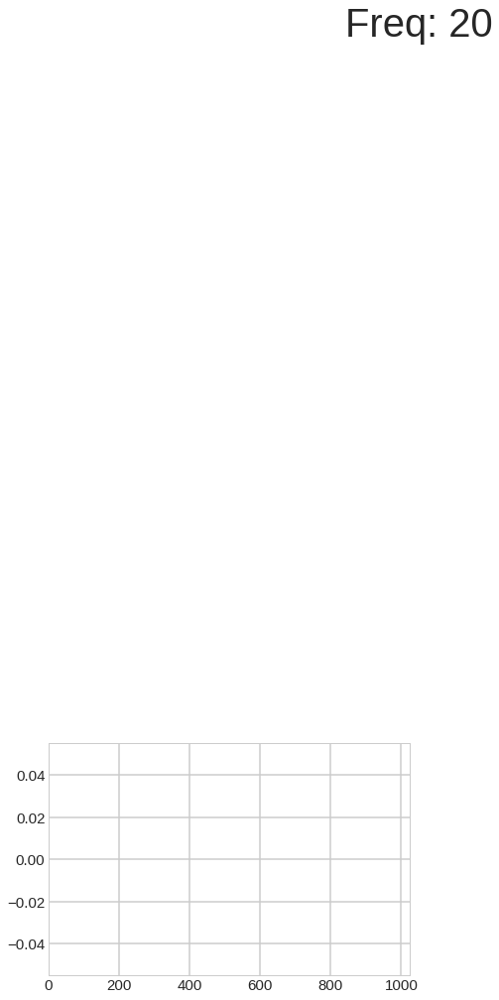

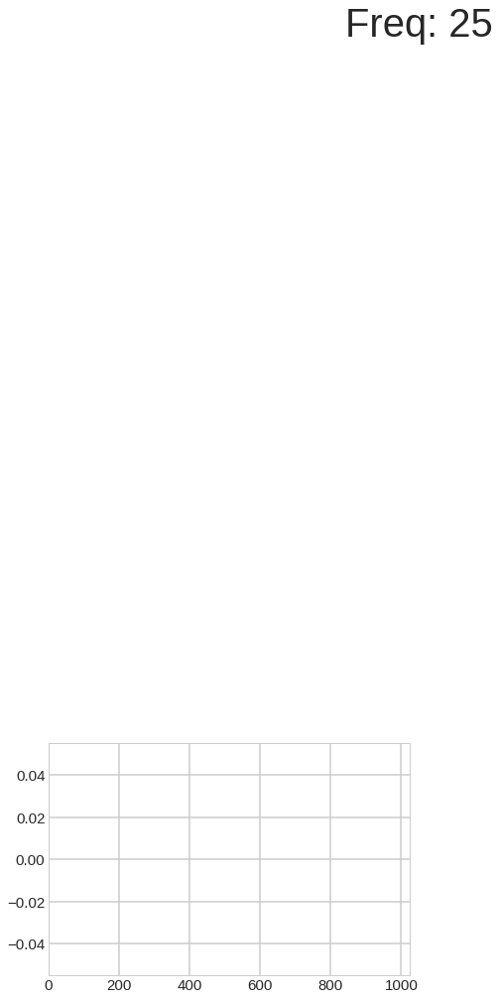

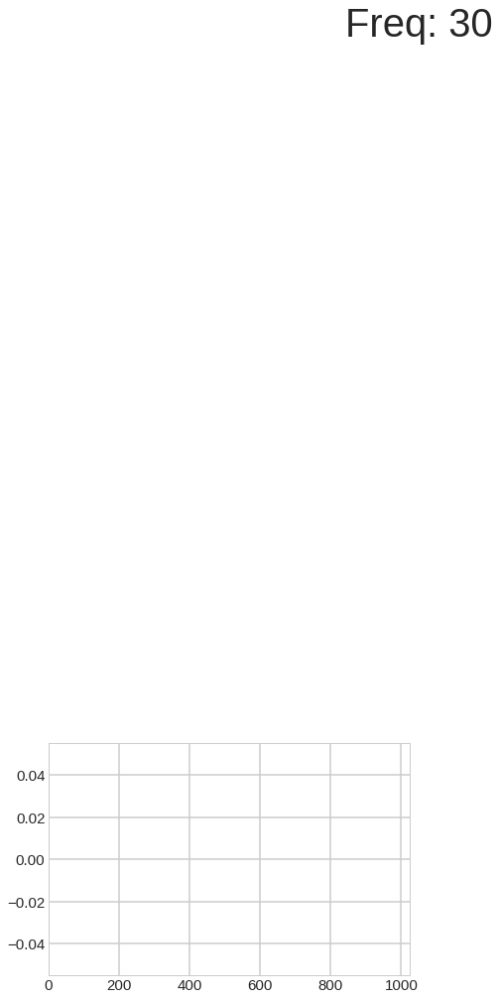

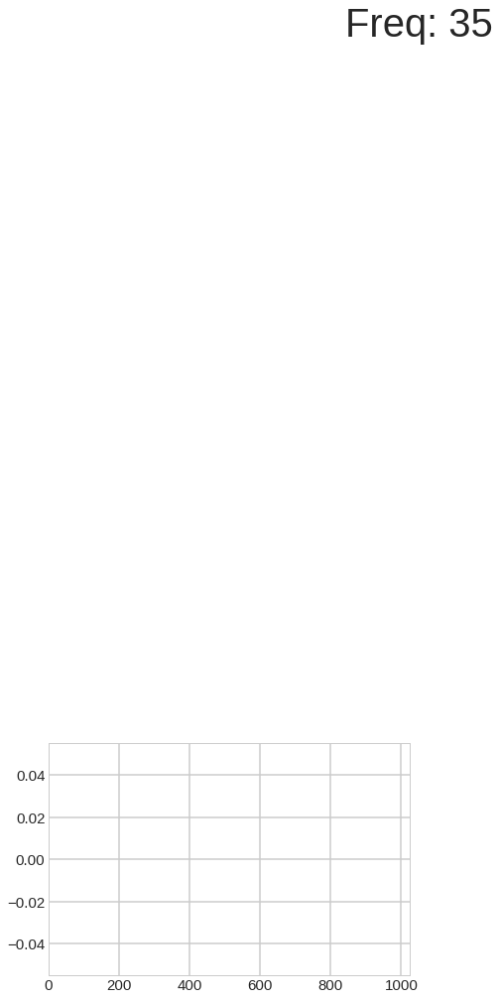

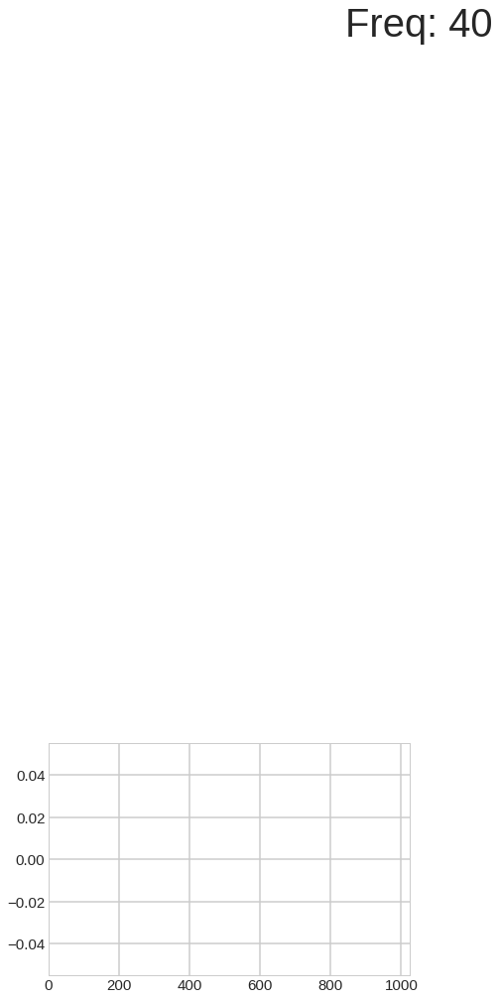

In [30]:
for exp_n, exp in enumerate(signal_mean[:,:-3,:]):
    plt.figure(figsize = (30,25))
    plt.suptitle(f'Freq: {czestosci[exp_n]}', fontsize=40)
    plt.subplot(5,4,i+1)
    plt.plot(channel)
    plt.xlim(0,Fs)    
#     for i, channel in enumerate(exp):
#         plt.subplot(5,4,i+1)
#         plt.plot(channel)
#         plt.xlim(0,Fs)

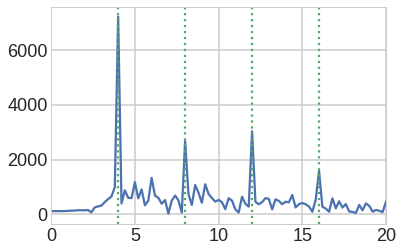

In [23]:
plt.plot(freq_mean, spectrum_fragments_mean_signal[0][0])
plt.xlim(0,20)
plt.axvline(4, color = 'g', ls = ':')
plt.axvline(8, color = 'g', ls = ':')
plt.axvline(12, color = 'g', ls = ':')
plt.axvline(16, color = 'g', ls = ':')
plt.show()

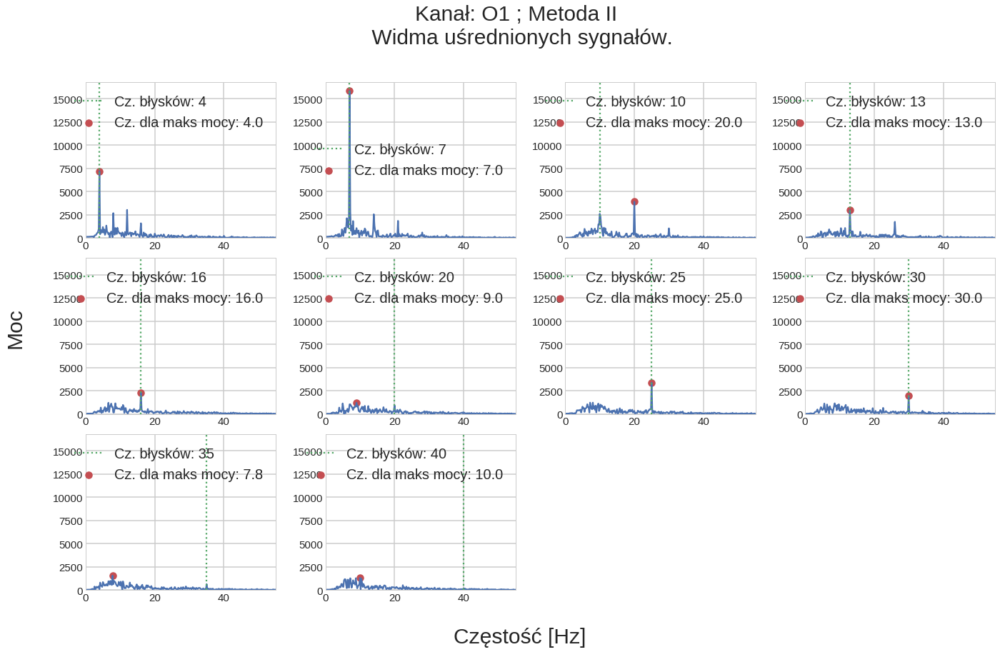

In [26]:
for ch, ch_name in enumerate(CH[0:1]):
#     plt.figure(figsize = (30,25))
    fig = plt.figure(figsize = (20,17))
#     plt.rc('axes', titlesize=25) 
    fig.text(0.5, 0.25, 'Częstość [Hz]', ha='center',fontsize=30)
    fig.text(0, 0.61, 'Moc', va='center', rotation='vertical',fontsize=30)
    fig.suptitle(f'Kanał: {ch_name} ; Metoda II \n Widma uśrednionych sygnałów.', fontsize=30)
    plt.rc('axes', labelsize=16)
    plt.rc('axes', titlesize=20) 
    plt.rc('xtick', labelsize=15)    # fontsize of the tick labels
    plt.rc('ytick', labelsize=15) 
    for i, fragment in enumerate(spectrum_fragments_mean_signal[:,ch]):
        plt.subplot(4,4,i+1)
        plt.plot(freq_mean, fragment)
        plt.xlim(0, 55)
        plt.ylim(0, 16800)
        plt.scatter(freq_mean[np.where(fragment == np.max(fragment))[0]], np.max(fragment) , color = 'r',label = f'Cz. dla maks mocy: {round(freq_mean[np.argmax(fragment)],2)}')
        plt.axvline(real_freqs[ind].reshape(10,30)[i][0], ls = ':', color = 'g',label = f'Cz. błysków: {real_freqs[ind].reshape(10,30)[i][0]}')
#         plt.title(f'max cz: {round(freq_mean[np.argmax(fragment)],2)} , cz. bł.: {real_freqs[ind].reshape(10,30)[i][0]}')
#         plt.xlabel('Częstość [Hz]')
#         plt.ylabel('Moc')
        plt.legend()
    plt.tight_layout(rect=[0.03, 0.1, 0.97, 0.9])
plt.show()

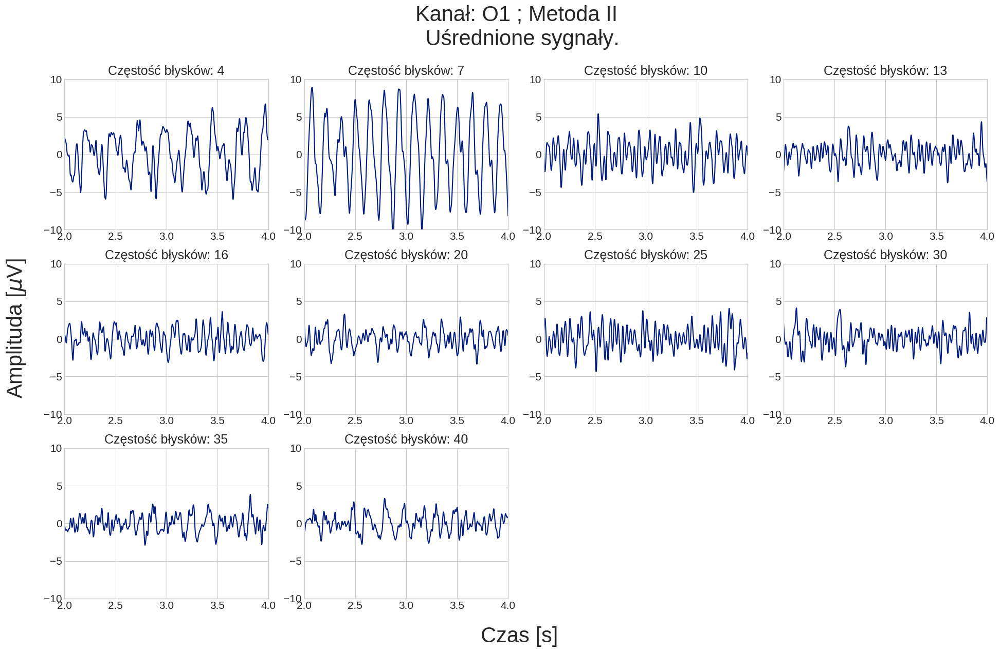

In [354]:
for ch, ch_name in enumerate(CH[0:1]):
    fig = plt.figure(figsize = (20,17))
    fig.text(0.5, 0.25, 'Czas [s]', ha='center',fontsize=30)
    fig.text(0, 0.61, 'Amplituda [$\mu$V]', va='center', rotation='vertical',fontsize=30)
    plt.suptitle(f'Kanał: {ch_name} ; Metoda II \n Uśrednione sygnały.', fontsize=30)
    plt.rc('axes', labelsize=16)
    plt.rc('axes', titlesize=18) 
    plt.rc('xtick', labelsize=15)    # fontsize of the tick labels
    plt.rc('ytick', labelsize=15) 
    for i, fragment in enumerate(signal_mean[:,ch]):
        plt.subplot(4,4,i+1)
        plt.plot(np.arange(0,int(len(fragment)/Fs),1/Fs),fragment)
        plt.xlim(2, 4)
        plt.ylim(-10, 10)
#         plt.xlabel('Czas [s]')
#         plt.ylabel('Amplituda [$\mu$V]')
        plt.title(f'Częstość błysków: {czestosci[i]}')
    plt.tight_layout(rect=[0.03, 0.08, 0.97, 0.92])
plt.show()
#         plt.scatter(real_freqs[ind].reshape(10,30)[i][0], np.max(fragment) , color = 'g')
#         plt.axvline(real_freqs[ind].reshape(10,30)[i][0], ls = ':', color = 'g')
#         plt.title(f'max cz: {round(freq[np.argmax(fragment)],2)} , cz. bł.: {real_freqs[ind].reshape(10,30)[i][0]}')

In [62]:
czestosci =  (4, 7, 10, 13, 16, 20, 25, 30, 35, 40)
channel=0
# numer_czestosci = 0
N = 1000
rozklad3 = np.zeros((len(czestosci),N))
for numer_czestosci in progressbar.progressbar(range(len(czestosci))):
    for i in range(N):
        losowe_ind = np.random.randint(30,size=30)
        losowe = sorted_reshaped_fragments[numer_czestosci,losowe_ind,channel,:]
        mean_signal = np.mean(losowe, axis=0)
        spec_losowe_mean = np.abs(np.fft.rfft(mean_signal))
        freq = np.fft.rfftfreq(losowe.shape[-1], 1/Fs)
        ind_cz = int((spec_losowe_mean.shape[-1]/(Fs//2))*czestosci[numer_czestosci])
        rozklad3[numer_czestosci,i] = spec_losowe_mean[ind_cz]

#     plt.hist(rozklad[numer_czestosci],bins =30)
#     plt.show()


np.save("rozklad3", rozklad3)

100% (10 of 10) |########################| Elapsed Time: 0:00:02 Time:  0:00:02


In [63]:
counter = 0
N = 1000
rozklad4 = np.zeros((len(czestosci),N))
for numer_czestosci in progressbar.progressbar(range(len(czestosci))):
    fragmenty=np.delete(sorted_reshaped_fragments.copy(), numer_czestosci, axis=0)
    for i in range(N):
        losowe_ind = np.random.randint(30,size=30)
        losowe = fragmenty[:,losowe_ind,channel,:]
        mean_signal = np.mean(losowe, axis=(0,1))
        spec_losowe_mean = np.abs(np.fft.rfft(mean_signal))
        freq = np.fft.rfftfreq(losowe.shape[-1], 1/Fs)
        ind_cz = int((spec_losowe_mean.shape[-1]/(Fs//2))*czestosci[numer_czestosci])
        rozklad4[numer_czestosci,i] = spec_losowe_mean[ind_cz]
        counter += 1
#     plt.hist(rozklad4[numer_czestosci],bins =30)
#     plt.show()

np.save("rozklad4", rozklad4)

100% (10 of 10) |########################| Elapsed Time: 0:00:28 Time:  0:00:28


In [132]:
rozklad3 = np.load('rozklad3.npy')
rozklad4 = np.load('rozklad4.npy')

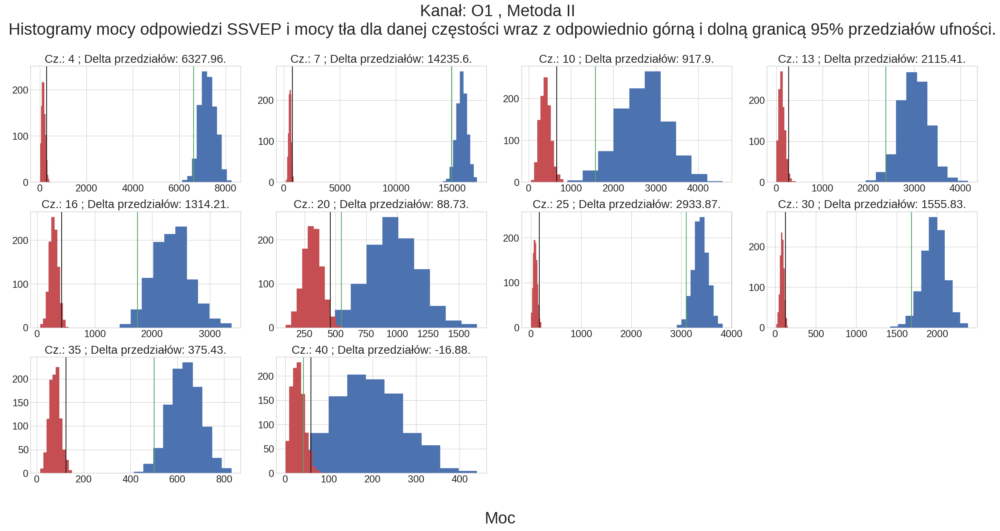

In [397]:
channel=0
# fig.suptitle(f'Channel: {CH[channel]}', fontsize=40)
fig = plt.figure(figsize=(25,14))
fig.suptitle(f'Kanał: {CH[channel]} , Metoda II \n Histogramy mocy odpowiedzi SSVEP i mocy tła dla danej częstości wraz z odpowiednio górną i dolną granicą 95% przedziałów ufności.', fontsize=30)
# plt.rc('axes', titlesize=25)     # fontsize of the axes title
# plt.rc('axes', labelsize=20)
plt.rc('axes', labelsize=16)
plt.rc('axes', titlesize=21) 
plt.rc('xtick', labelsize=18)    # fontsize of the tick labels
plt.rc('ytick', labelsize=18) 
fig.text(0.5, 0.04, 'Moc', ha='center',fontsize=30)
for i in range(len(rozklad)):
    plt.subplot(3,4,i+1)
#     plt.xlabel('Moc')
#     print(f'Rozklady dla częstości: {czestosci[i]}')
    cent3 = np.percentile(rozklad3[i], 2.5)
    cent4 = np.percentile(rozklad4[i], 97.5)
    plt.axvline(cent3, color = 'g')
    plt.axvline(cent4, color = 'k')
    plt.title(f'Cz.: {czestosci[i]} ; Delta przedziałów: {round(cent3-cent4,2)}.')
#     print(f'Różnica między centylami: {round(cent3-cent4,2)}')
    plt.hist(rozklad3[i], color = 'b', edgecolor='b')
    plt.hist(rozklad4[i], color = 'r', edgecolor='r')
fig.tight_layout(rect=[0, 0.1, 1, 0.9])
plt.show()

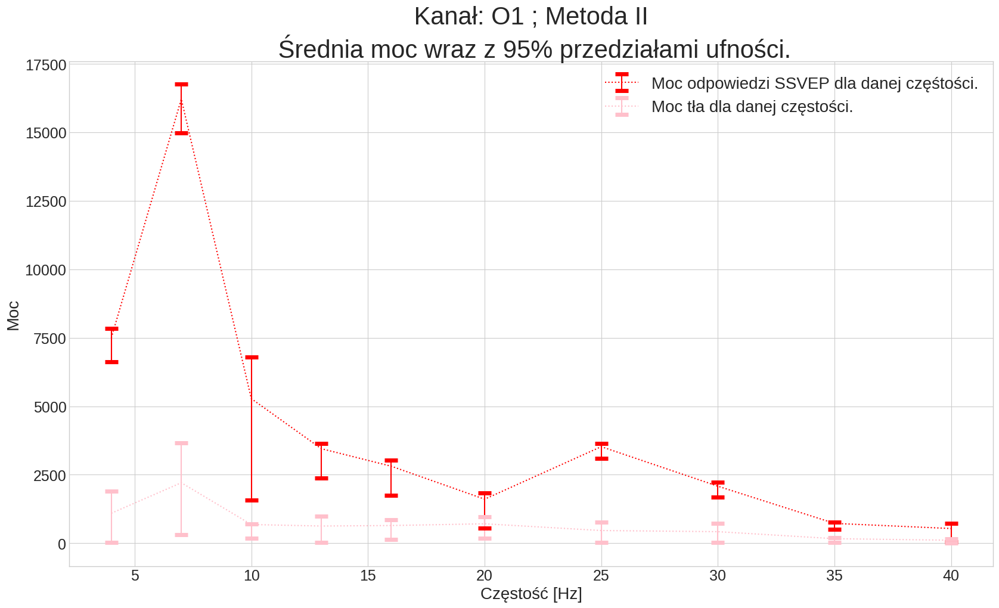

In [400]:
ch, ch_name = (0, 'O1')
plt.figure(figsize = (20,11))
# plt.suptitle(f'Kanał: {ch_name} ; Metoda II', fontsize=30)
czestosci = np.array(czestosci)
ind=len(np.fft.rfft(sorted_reshaped_fragments[2,5,2,:]))
ind_cz = ((ind/(Fs//2))*czestosci).astype(int)
# ind_cz = ((spec_losowe_mean.shape[-1]/(Fs//2))*czestosci).astype(int)

numerki = np.arange(0,10,1)
cent3a = []
cent3b = []
cent4a = []
cent4b = []

for i in numerki:
    cent3a.append(np.percentile(rozklad3[i], 2.5))
    cent3b.append(np.percentile(rozklad3[i], 97.5))
    cent4a.append(np.percentile(rozklad4[i], 2.5))
    cent4b.append(np.percentile(rozklad4[i], 97.5))
    
for numer_czestosci in range(len(czestosci)):
    fragmenty=np.delete(spectrum_fragments_mean_signal.copy(), numer_czestosci, axis=0)
fragmenty = np.mean(fragmenty, axis=0)
    
y3 = spectrum_fragments[numerki,0,ind_cz]
cent3a = np.absolute(y3 - np.array(cent3a))
cent3b = np.absolute(y3 - np.array(cent3b))
y4 = fragmenty[0,ind_cz]
cent4a = np.absolute(y4 - np.array(cent4a))
cent4b = np.absolute(y4 - np.array(cent4b))

plt.rc('legend', fontsize=20) 
# plt.rc('axes', titlesize=40) 
plt.rc('axes', labelsize=20)
plt.rc('axes', titlesize=30) 
plt.rc('xtick', labelsize=18)    # fontsize of the tick labels
plt.rc('ytick', labelsize=18)
plt.title(f" Kanał: {ch_name} ; Metoda II \n Średnia moc wraz z 95% przedziałami ufności.")
plt.errorbar(czestosci, y3, yerr = (cent3a, cent3b), capsize =8, ls = ':', capthick = 5,color='red',label = "Moc odpowiedzi SSVEP dla danej częśtości.")
plt.errorbar(czestosci, y4, yerr = (cent4a, cent4b), capsize =8, ls = ':', capthick = 5,color='pink',label = "Moc tła dla danej częstości.")
plt.xlabel("Częstość [Hz]")
plt.ylabel("Moc")
fig.tight_layout(rect=[0, 0.05, 1, 0.95])
plt.legend()
plt.show()

## Sposób III:

*    Dla każdego powtórzenia o danej częstości oblicz transformatę Fouriera
*    Uśrednij zespolone transformaty
*    Wyestymuj widmo amplitudowe z uśrednionej transformaty Fouriera (oblicz jej moduł), wraz z 95% przedziałem ufności dla średniej. Dla każdej częstości stymulacji wyznacz także poziom tła.
*    Sporządź wykres odpowiedzi SSVEP od częstości. Znajdź częstości, dla których odpowiedź ta była najsilniejsza.

In [45]:
fourier_fragments = np.fft.rfft(sorted_reshaped_fragments)
fourier_fragments_mean = np.mean(fourier_fragments, axis=1)
fourier_fragments_mean.shape
fourier_spectrums = np.abs(fourier_fragments_mean)
print(f'fourier_spectrums: {fourier_spectrums.shape}')
freq_complex = np.fft.rfftfreq(signal_mean.shape[-1], 1/Fs)

fourier_spectrums: (10, 22, 2561)


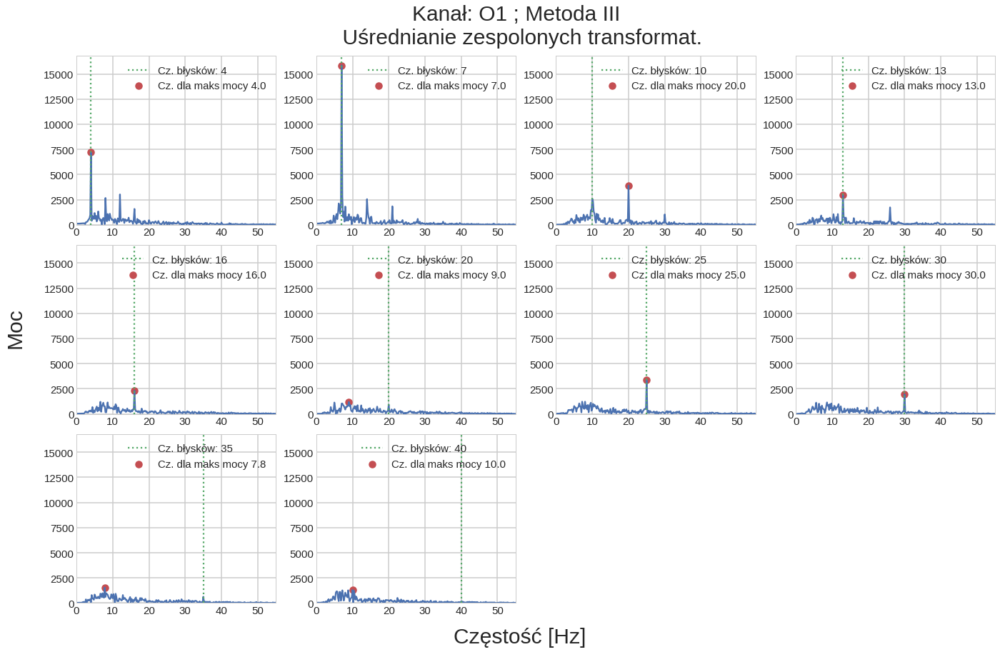

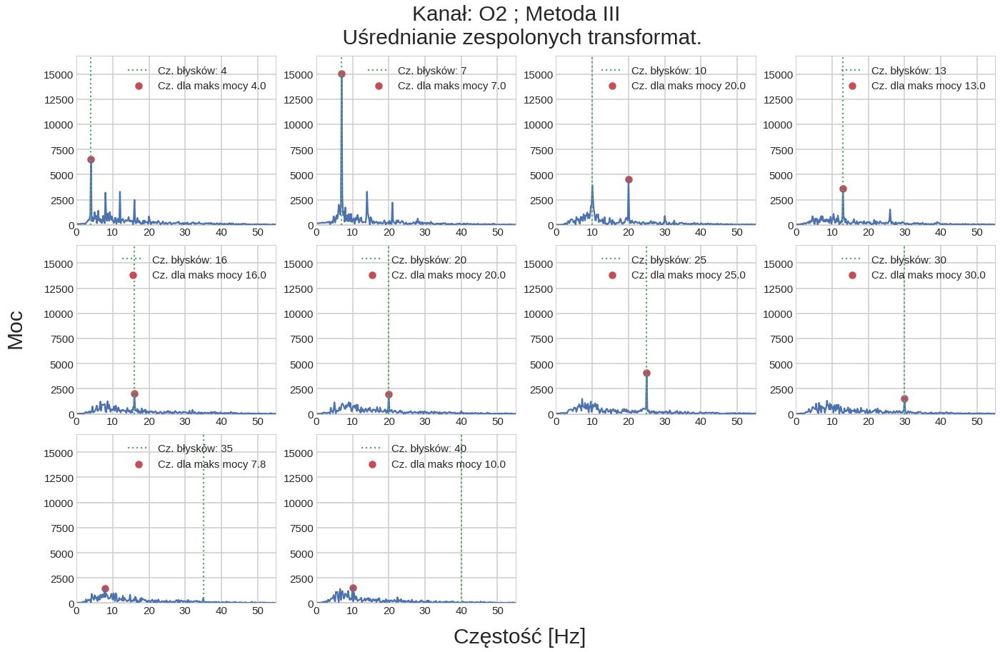

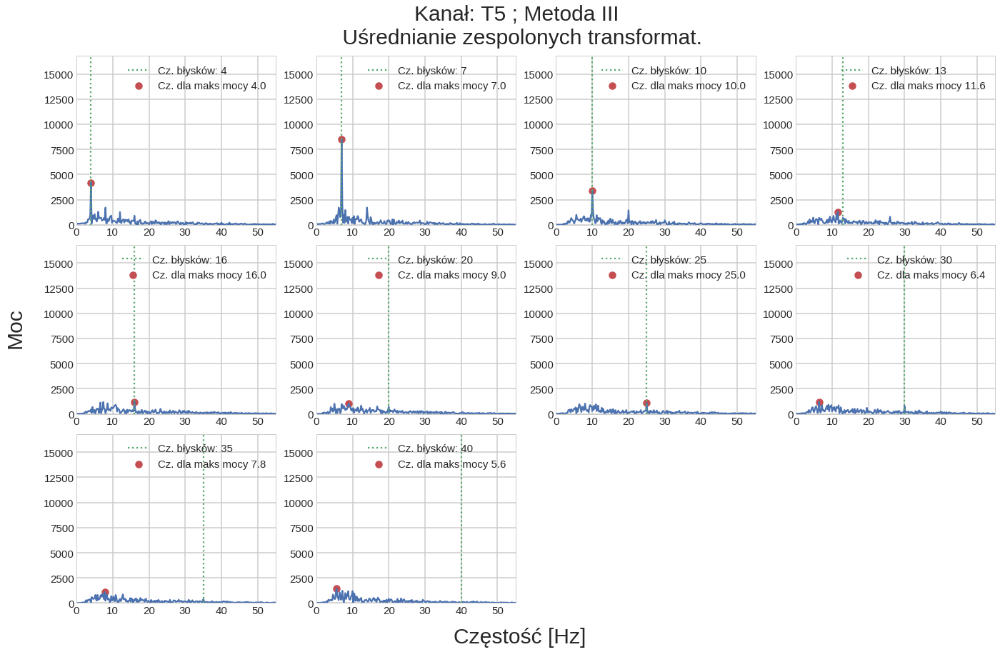

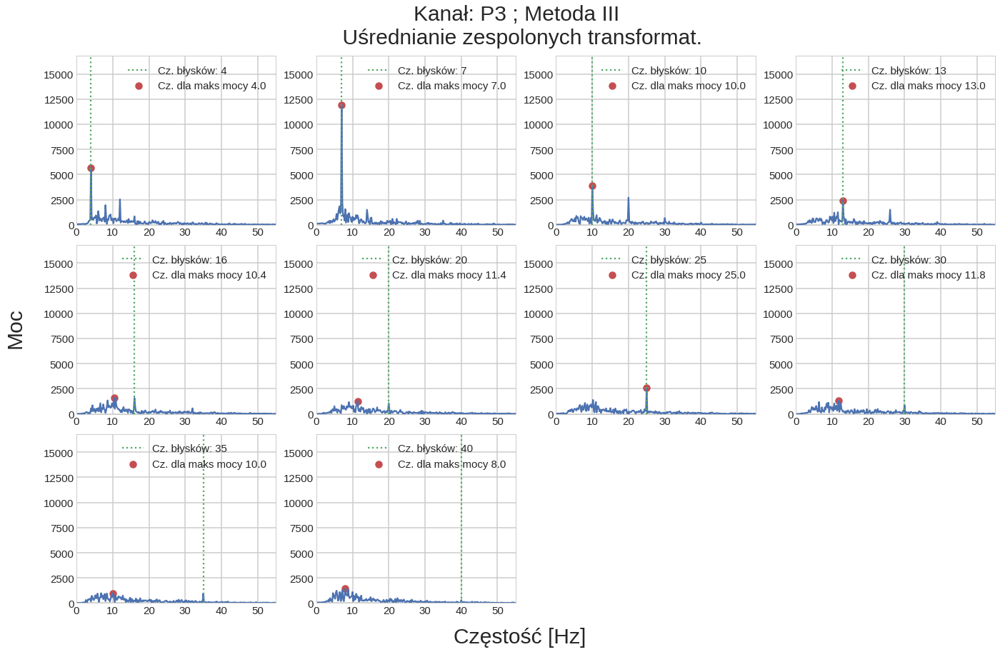

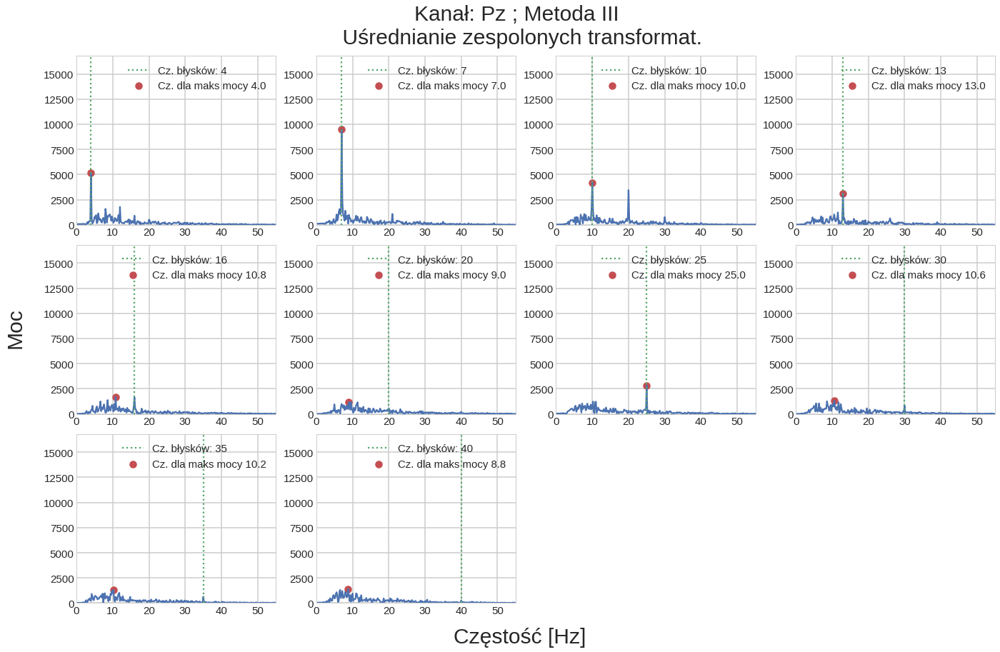

...

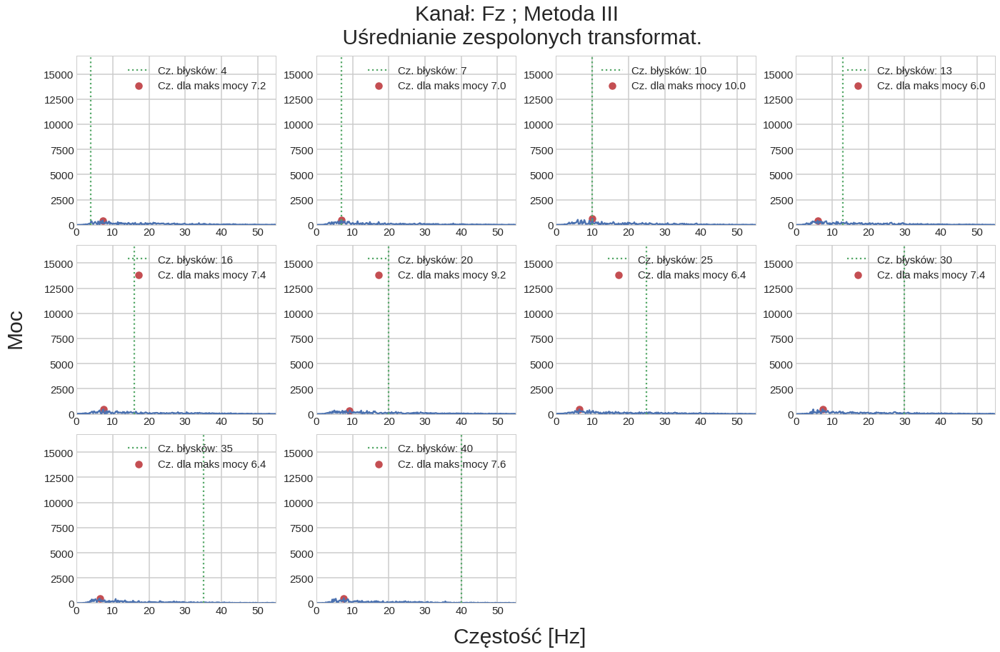

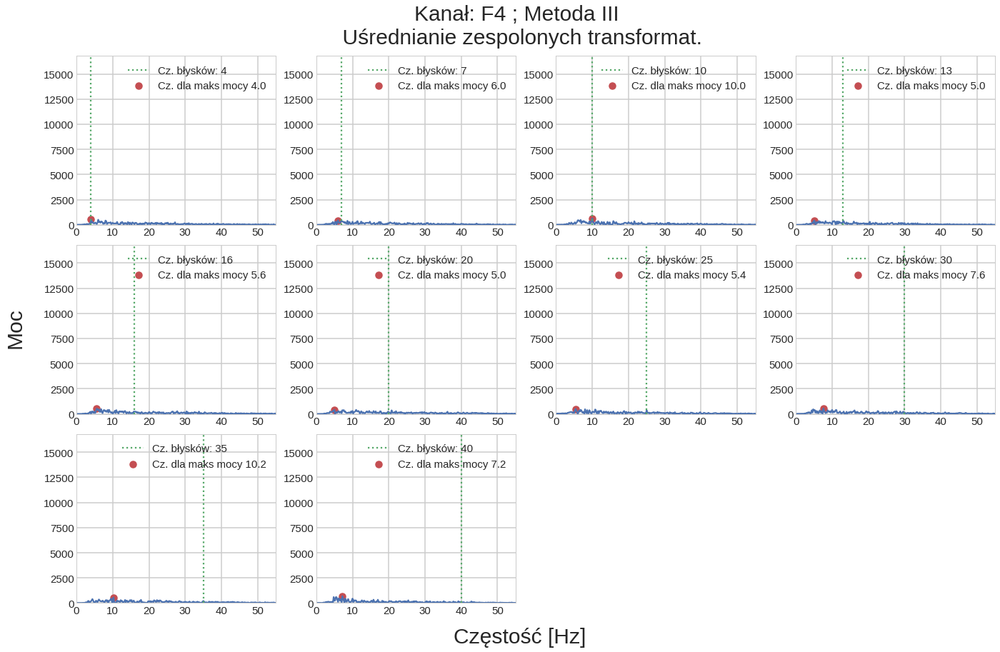

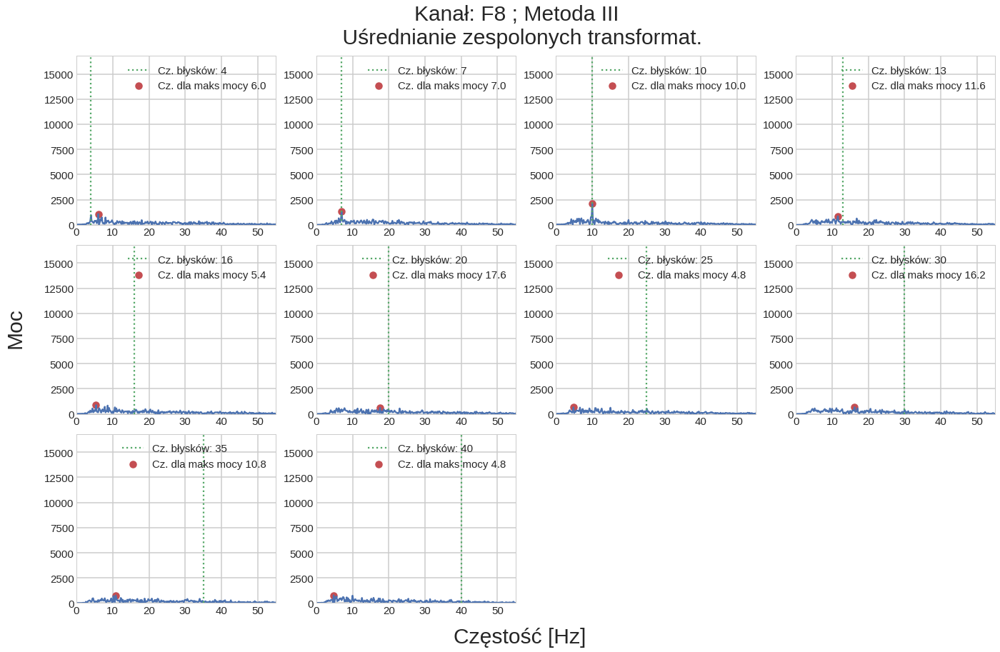

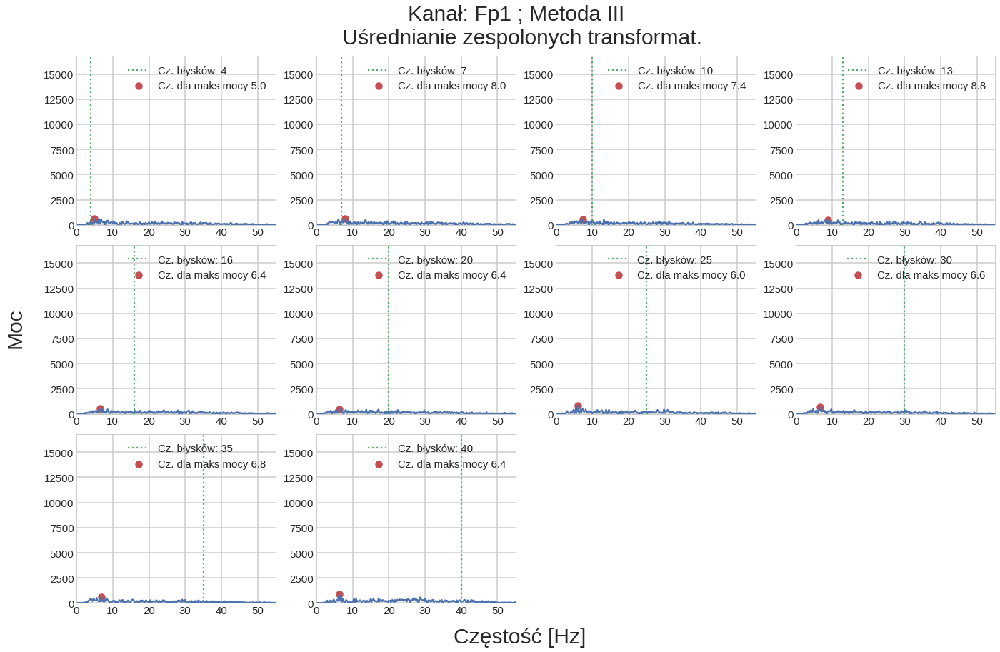

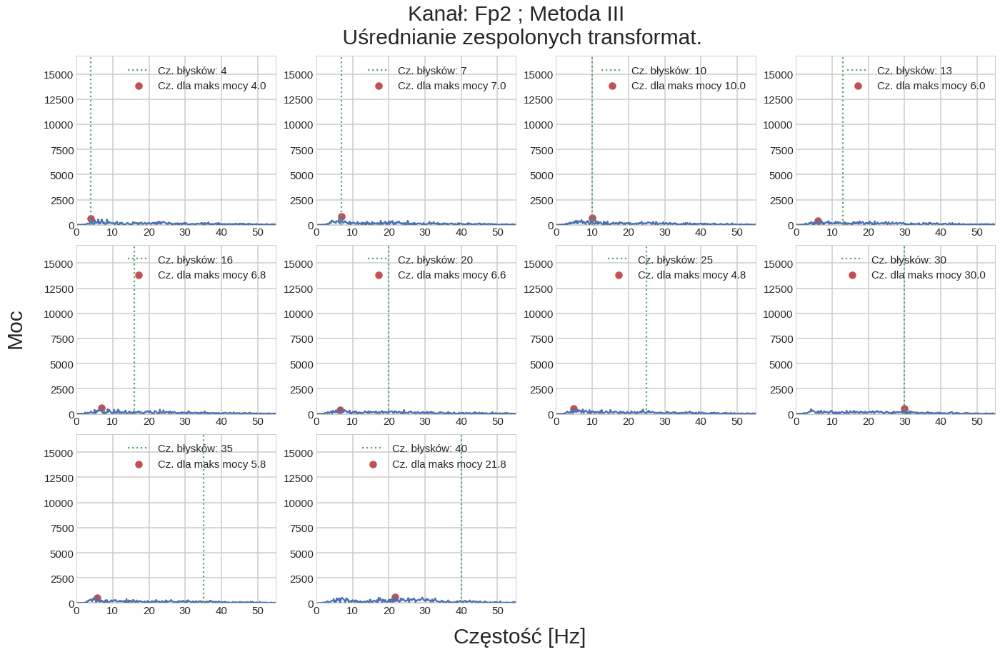

In [47]:
for ch, ch_name in enumerate(CH[:19]):
    fig=plt.figure(figsize = (20,17))#,sharex=True, sharey=True)
    fig.text(0.5, 0.25, 'Częstość [Hz]', ha='center',fontsize=30)
    fig.text(0, 0.61, 'Moc', va='center', rotation='vertical',fontsize=30)
    plt.suptitle(f'Kanał: {ch_name} ; Metoda III \n Uśrednianie zespolonych transformat.', fontsize=30)
    plt.rc('axes', labelsize=16)
    plt.rc('axes', titlesize=20) 
    plt.rc('xtick', labelsize=15)    # fontsize of the tick labels
    plt.rc('ytick', labelsize=15)
    plt.rc('legend', fontsize=15)
    for i, fragment in enumerate(fourier_spectrums[:,ch]):
        plt.subplot(4,4,i+1)
        plt.plot(freq_complex, fragment)
        plt.xlim(0, 55)
        plt.ylim(0, 16800)
        plt.scatter(freq_complex[np.where(fragment == np.max(fragment))[0]], np.max(fragment) , color = 'r',label = f'Cz. dla maks mocy {round(abs(freq_complex[np.argmax(fragment)]),2)}')
        plt.axvline(real_freqs[ind].reshape(10,30)[i][0], ls = ':', color = 'g',label = f'Cz. błysków: {real_freqs[ind].reshape(10,30)[i][0]}')
#         plt.xlabel('Częstość [Hz]')
#         plt.ylabel('Moc')
        
        plt.legend()
#         plt.title(f'max cz: {round(abs(freq_complex[np.argmax(fragment)]),2)} , cz. bł.: {real_freqs[ind].reshape(10,30)[i][0]}')
    plt.tight_layout(rect=[0.03, 0.07, 0.97, 0.93])
    plt.show()

In [71]:
czestosci =  (4, 7, 10, 13, 16, 20, 25, 30, 35, 40)
channel=0
# numer_czestosci = 0
N = 1000
rozklad5 = np.zeros((len(czestosci),N))
for numer_czestosci in progressbar.progressbar(range(len(czestosci))):
    for i in range(N):
        losowe_ind = np.random.randint(30,size=30)
        losowe = sorted_reshaped_fragments[numer_czestosci,losowe_ind,channel,:]
        spec_losowe = np.fft.rfft(losowe)
#         print(spec_losowe.shape)
        spec_losowe_mean = np.abs(np.mean(spec_losowe, axis = 0))
        freq = np.fft.rfftfreq(losowe.shape[-1], 1/Fs)
        ind_cz = int((spec_losowe_mean.shape[-1]/(Fs//2))*czestosci[numer_czestosci])
        rozklad5[numer_czestosci,i] = spec_losowe_mean[ind_cz]

#     plt.hist(rozklad[numer_czestosci],bins =30)
#     plt.show()
np.save("rozklad5", rozklad5)


100% (10 of 10) |########################| Elapsed Time: 0:00:15 Time:  0:00:15


In [72]:
counter = 0
N = 1000
rozklad6 = np.zeros((len(czestosci),N))
for numer_czestosci in progressbar.progressbar(range(len(czestosci))):
    fragmenty=np.delete(sorted_reshaped_fragments.copy(), numer_czestosci, axis=0)
    for i in range(N):
        losowe_ind = np.random.randint(30,size=30)
        losowe = fragmenty[:,losowe_ind,channel,:]
        spec_losowe = np.fft.rfft(losowe)
        spec_losowe_mean = np.abs(np.mean(spec_losowe, axis = (0,1)))
        freq = np.fft.rfftfreq(losowe.shape[-1], 1/Fs)
        ind_cz = int((spec_losowe_mean.shape[-1]/(Fs//2))*czestosci[numer_czestosci])
        rozklad6[numer_czestosci,i] = spec_losowe_mean[ind_cz]
        counter += 1
np.save("rozklad6", rozklad6)

100% (10 of 10) |########################| Elapsed Time: 0:02:52 Time:  0:02:52


In [235]:
rozklad5 = np.load('rozklad5.npy')
rozklad6 = np.load('rozklad6.npy')

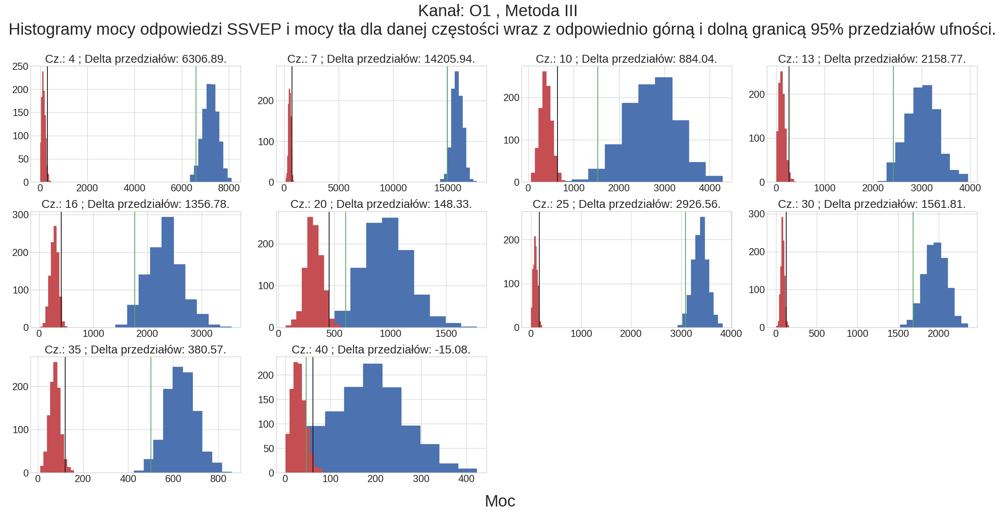

In [409]:
channel=0
# fig.suptitle(f'Channel: {CH[channel]}', fontsize=40)
fig = plt.figure(figsize=(25,14))
fig.suptitle(f'Kanał: {CH[channel]} , Metoda III \n Histogramy mocy odpowiedzi SSVEP i mocy tła dla danej częstości wraz z odpowiednio górną i dolną granicą 95% przedziałów ufności.', fontsize=30)
# plt.rc('axes', titlesize=25)     # fontsize of the axes title
# plt.rc('axes', labelsize=20)
plt.rc('axes', labelsize=18)
plt.rc('axes', titlesize=21) 
plt.rc('xtick', labelsize=18)    # fontsize of the tick labels
plt.rc('ytick', labelsize=18) 
fig.text(0.5, 0.07, 'Moc', ha='center',fontsize=30)
for i in range(len(rozklad)):
    plt.subplot(3,4,i+1)
#     plt.xlabel('Moc')
#     print(f'Rozklady dla częstości: {czestosci[i]}')
    cent5 = np.percentile(rozklad5[i], 2.5)
    cent6 = np.percentile(rozklad6[i], 97.5)
    plt.axvline(cent5, color = 'g')
    plt.axvline(cent6, color = 'k')
    plt.title(f'Cz.: {czestosci[i]} ; Delta przedziałów: {round(cent5-cent6,2)}.')
#     print(f'Różnica między centylami: {round(cent3-cent4,2)}')
    plt.hist(rozklad5[i], color = 'b', edgecolor='b')
    plt.hist(rozklad6[i], color = 'r', edgecolor='r')
fig.tight_layout(rect=[0, 0.1, 1, 0.9])
plt.show()

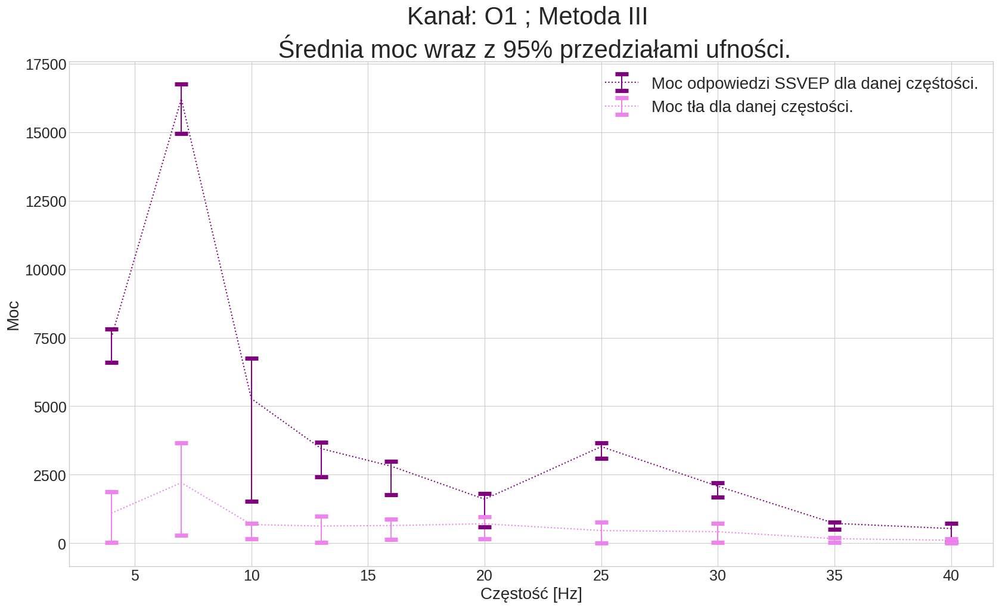

In [402]:
ch, ch_name = (0, 'O1')
plt.figure(figsize = (20,11))
# plt.suptitle(f'Channel: {ch_name}', fontsize=40)
czestosci = np.array(czestosci)
ind=len(np.fft.rfft(sorted_reshaped_fragments[2,5,2,:]))
ind_cz = ((ind/(Fs//2))*czestosci).astype(int)
# ind_cz = ((spec_losowe_mean.shape[-1]/(Fs//2))*czestosci).astype(int)

numerki = np.arange(0,10,1)
cent5a = []
cent5b = []
cent6a = []
cent6b = []

for i in numerki:
    cent5a.append(np.percentile(rozklad5[i], 2.5))
    cent5b.append(np.percentile(rozklad5[i], 97.5))
    cent6a.append(np.percentile(rozklad6[i], 2.5))
    cent6b.append(np.percentile(rozklad6[i], 97.5))
    
for numer_czestosci in range(len(czestosci)):
    fragmenty=np.delete(spectrum_fragments_mean_signal.copy(), numer_czestosci, axis=0)
fragmenty = np.mean(fragmenty, axis=0)
    
y5 = spectrum_fragments[numerki,0,ind_cz]
cent5a = np.absolute(y5 - np.array(cent5a))
cent5b = np.absolute(y5 - np.array(cent5b))
y6 = fragmenty[0,ind_cz]
cent6a = np.absolute(y6 - np.array(cent6a))
cent6b = np.absolute(y6 - np.array(cent6b))
plt.rc('legend', fontsize=20) 
# plt.rc('axes', titlesize=40) 
plt.rc('axes', labelsize=20)
plt.rc('axes', titlesize=30) 
plt.rc('xtick', labelsize=18)    # fontsize of the tick labels
plt.rc('ytick', labelsize=18)
plt.title(f"Kanał: {ch_name} ; Metoda III \n Średnia moc wraz z 95% przedziałami ufności.")
plt.errorbar(czestosci, y5, yerr = (cent5a, cent5b), capsize =8, ls = ':', capthick = 5,color='purple',label = "Moc odpowiedzi SSVEP dla danej częśtości.")
plt.errorbar(czestosci, y6, yerr = (cent6a, cent6b), capsize =8, ls = ':', capthick = 5,color='violet',label = "Moc tła dla danej częstości.")
plt.xlabel("Częstość [Hz]")
plt.ylabel("Moc")
fig.tight_layout(rect=[0, 0.05, 1, 0.95])
plt.legend()
plt.show()

## Porównaj opisane powyżej trzy metody. Przy porównaniu uwzględnij:

  *  Średnie widma przy stymulacji określoną częstością.
  *  Uzyskane krzywe odpowiedzi SSVEP i wyestymowane przedziały ufności.
  *  Odstęp między poziomem odpowiedzi a poziomem tła.

Czy można wyciągnąć jakieś wnioski na temat związku między fazą bodźca a fazą odpowiedzi?

No handles with labels found to put in legend.


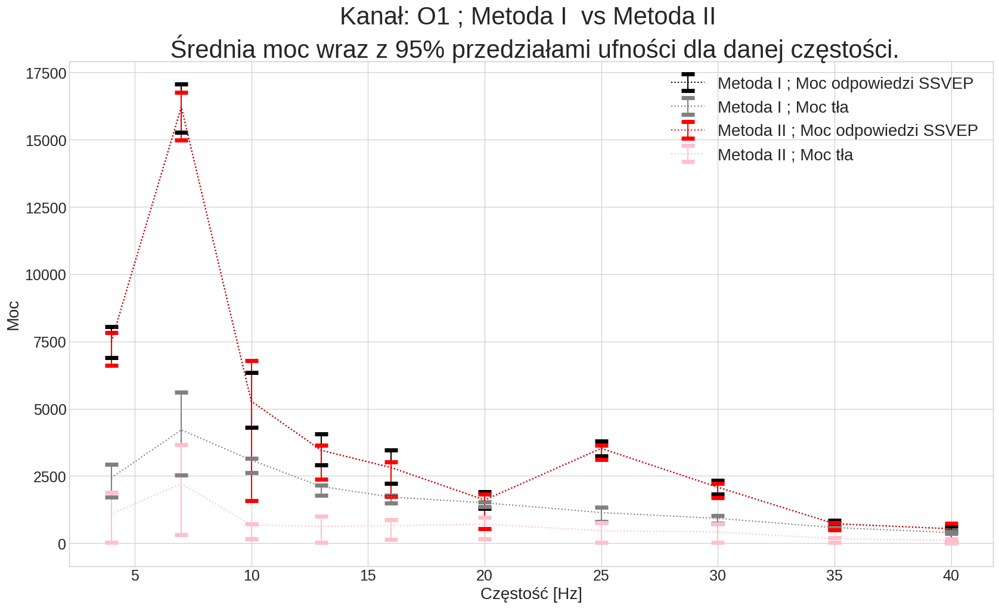

In [403]:
ch, ch_name = (0, 'O1')
plt.figure(figsize = (20,11))
# plt.suptitle(f'Channel: {ch_name}', fontsize=40)

plt.rc('legend', fontsize=20) 
# plt.rc('axes', titlesize=40) 
plt.rc('axes', labelsize=20)
plt.rc('axes', titlesize=30) 
plt.rc('xtick', labelsize=18)    # fontsize of the tick labels
plt.rc('ytick', labelsize=18)
plt.title(f"Kanał: {ch_name} ; Metoda I  vs Metoda II \n Średnia moc wraz z 95% przedziałami ufności dla danej częstości.")
plt.xlabel("Częstość [Hz]")
plt.ylabel("Moc")
fig.tight_layout(rect=[0, 0.05, 1, 0.95])
plt.legend()


plt.errorbar(czestosci, y1, yerr = (cent1a, cent1b), capsize =8, ls = ':', capthick = 5, label = 'Metoda I ; Moc odpowiedzi SSVEP',color='black')
plt.errorbar(czestosci, y2, yerr = (cent2a, cent2b), capsize =8, ls = ':', capthick = 5, label = 'Metoda I ; Moc tła',color="grey")
plt.errorbar(czestosci, y3, yerr = (cent3a, cent3b), capsize =8, ls = ':', capthick = 5, label = 'Metoda II ; Moc odpowiedzi SSVEP',color='red')
plt.errorbar(czestosci, y4, yerr = (cent4a, cent4b), capsize =8, ls = ':', capthick = 5, label = 'Metoda II ; Moc tła',color='pink')
plt.legend()
plt.show()

No handles with labels found to put in legend.


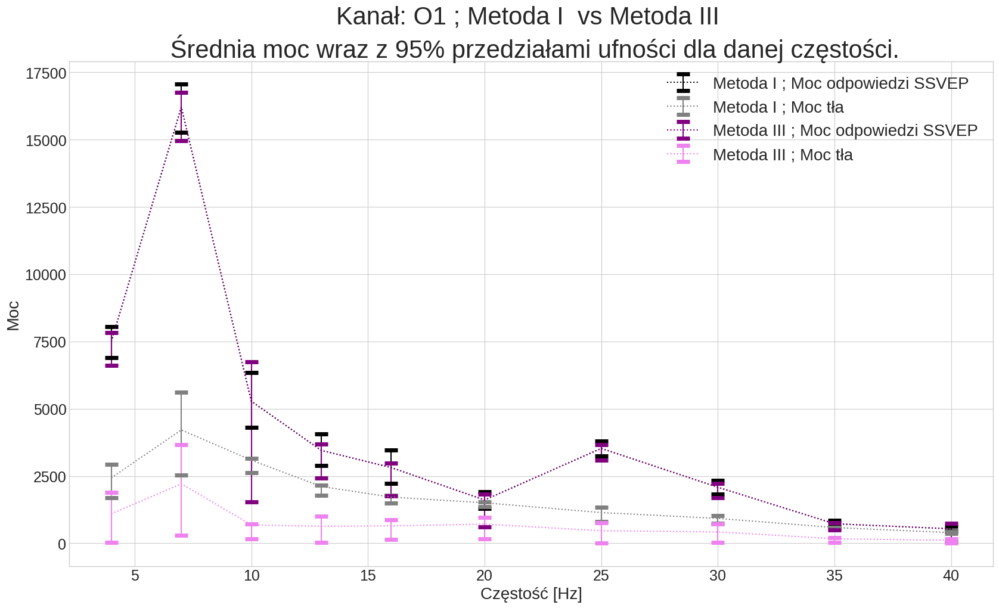

In [404]:
ch, ch_name = (0, 'O1')
plt.figure(figsize = (20,11))
# plt.suptitle(f'Channel: {ch_name}', fontsize=40)

plt.rc('legend', fontsize=20) 
# plt.rc('axes', titlesize=40) 
plt.rc('axes', labelsize=20)
plt.rc('axes', titlesize=30) 
plt.rc('xtick', labelsize=18)    # fontsize of the tick labels
plt.rc('ytick', labelsize=18)
plt.title(f"Kanał: {ch_name} ; Metoda I  vs Metoda III \n Średnia moc wraz z 95% przedziałami ufności dla danej częstości.")
plt.xlabel("Częstość [Hz]")
plt.ylabel("Moc")
fig.tight_layout(rect=[0, 0.05, 1, 0.95])
plt.legend()

plt.errorbar(czestosci, y1, yerr = (cent1a, cent1b), capsize =8, ls = ':', capthick = 5, label = 'Metoda I ; Moc odpowiedzi SSVEP',color='black')
plt.errorbar(czestosci, y2, yerr = (cent2a, cent2b), capsize =8, ls = ':', capthick = 5, label = 'Metoda I ; Moc tła',color='grey')
plt.errorbar(czestosci, y5, yerr = (cent5a, cent5b), capsize =8, ls = ':', capthick = 5, label = 'Metoda III ; Moc odpowiedzi SSVEP',color='purple')
plt.errorbar(czestosci, y6, yerr = (cent6a, cent6b), capsize =8, ls = ':', capthick = 5, label = 'Metoda III ; Moc tła',color='violet')
plt.legend()
plt.show()

No handles with labels found to put in legend.


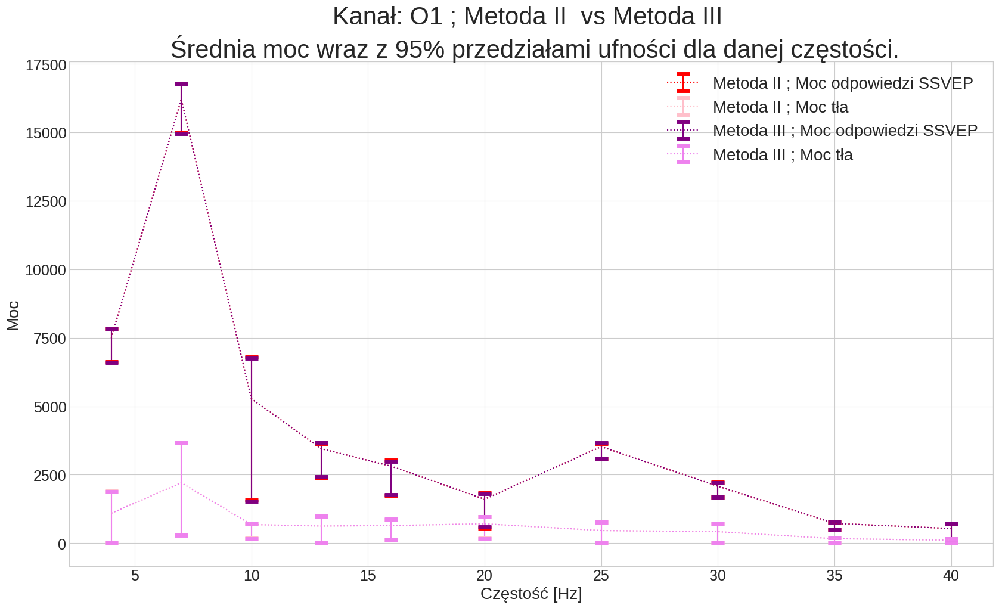

In [405]:
ch, ch_name = (0, 'O1')
# plt.figure(figsize = (30,25))
plt.figure(figsize = (20,11))
# plt.suptitle(f'Channel: {ch_name}', fontsize=40)

plt.rc('legend', fontsize=20) 
# plt.rc('axes', titlesize=40) 
plt.rc('axes', labelsize=20)
plt.rc('axes', titlesize=30) 
plt.rc('xtick', labelsize=18)    # fontsize of the tick labels
plt.rc('ytick', labelsize=18)
plt.title(f"Kanał: {ch_name} ; Metoda II  vs Metoda III \n Średnia moc wraz z 95% przedziałami ufności dla danej częstości.")
plt.xlabel("Częstość [Hz]")
plt.ylabel("Moc")
fig.tight_layout(rect=[0, 0.05, 1, 0.95])
plt.legend()

plt.errorbar(czestosci, y3, yerr = (cent3a, cent3b), capsize =8, ls = ':', capthick = 5, label = 'Metoda II ; Moc odpowiedzi SSVEP',color='red')
plt.errorbar(czestosci, y4, yerr = (cent4a, cent4b), capsize =8, ls = ':', capthick = 5, label = 'Metoda II ; Moc tła',color='pink')
plt.errorbar(czestosci, y5, yerr = (cent5a, cent5b), capsize =8, ls = ':', capthick = 5, label = 'Metoda III ; Moc odpowiedzi SSVEP',color='purple')
plt.errorbar(czestosci, y6, yerr = (cent6a, cent6b), capsize =8, ls = ':', capthick = 5, label = 'Metoda III ; Moc tła',color='violet')
plt.legend()
plt.show()

/home/beatka/.local/lib/python3.7/site-packages/matplotlib/figure.py:98: MatplotlibDeprecationWarning: 
Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  "Adding an axes using the same arguments as a previous axes "


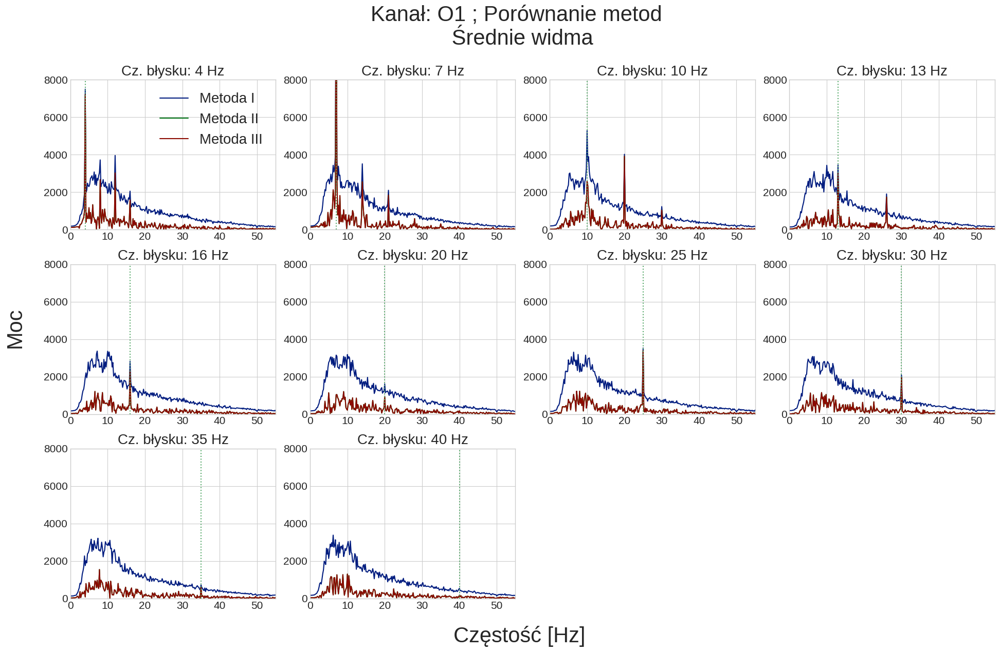

In [408]:
for ch, ch_name in enumerate(CH[0:1]):
    fig=plt.figure(figsize = (20,17))
    plt.suptitle(f'Kanał: {ch_name} ; Porównanie metod \n Średnie widma', fontsize=30)
    plt.rc('axes', labelsize=16)
    plt.rc('axes', titlesize=20) 
    plt.rc('xtick', labelsize=15)    # fontsize of the tick labels
    plt.rc('ytick', labelsize=15)
    fig.text(0.5, 0.25, 'Częstość [Hz]', ha='center',fontsize=30)
    fig.text(0, 0.61, 'Moc', va='center', rotation='vertical',fontsize=30)
    for i, fragment in enumerate(spectrum_fragments[:,ch]):
        plt.subplot(4,4,i+1)
        plt.plot(freq, fragment, label = 'Metoda I')
        
    for i, fragment in enumerate(spectrum_fragments_mean_signal[:,ch]):
        plt.subplot(4,4,i+1)
        plt.plot(freq_mean, fragment, label = 'Metoda II')
        
    for i, fragment in enumerate(fourier_spectrums[:,ch]):
        plt.subplot(4,4,i+1)
#         plt.xlabel('Częstość [Hz]')
#         plt.ylabel('Moc')
        plt.plot(freq_complex, fragment, label = 'Metoda III')
        plt.xlim(0, 55)
        plt.ylim(0, 8000)
        #plt.scatter(real_freqs[ind].reshape(10,15)[i][0], np.max(fragment) , color = 'g')
        plt.axvline(real_freqs[ind].reshape(10,30)[i][0], ls = ':', color = 'g')
        plt.title(f'Cz. błysku: {real_freqs[ind].reshape(10,30)[i][0]} Hz')
#     plt.subplot(4,4,15)
        if i ==0:
            plt.legend()
    plt.tight_layout(rect=[0.03, 0.08, 0.97, 0.92])
    plt.show()

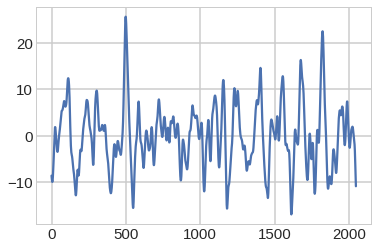

In [37]:
plt.plot(sorted_reshaped_fragments[1,8,0,:2*Fs])

In [102]:
trigger_index = -2
print(f'EEG Data: {EEG.data.shape}')
start = -0.3
stop = 0.6


okno = np.zeros(Fs)
trigger_values =  EEG.data[0, trigger_index, :].copy()
baseline = 1.1*np.mean(trigger_values[0:Fs])
baseline10 = 10*baseline
peaks = []
trg_values = []
i = 0
while i < len(trigger_values)-1:
    if trigger_values[i+1] > 5*trigger_values[i]:
        peaks.append(i)
        trg_values.append(trigger_values[i])
        i = i + Fs*5
    i += 1
        
print(f'Peaks count: {len(peaks)}')
fragments = np.zeros((len(peaks), 22, int(Fs*9)))
fragments.shape

# plt.figure(figsize=(16,4))
# plt.plot(EEG.data[0, trigger_index, :])
# plt.plot(peaks, EEG.data[0, trigger_index, peaks], "x")
# plt.xlim(((7+5)*Fs, (16+5)*Fs))
# plt.show()

for i, peak in enumerate(peaks):
    fragments[i,:,:] = EEG.data[0, :, int(peak-2*Fs):int(peak+Fs*7)]
print(f'fragments: {fragments.shape}')



EEG Data: (1, 22, 3145728)
Peaks count: 300
fragments: (300, 22, 9216)


In [103]:
sorted_fragments = fragments[ind]
print(f'sorted_fragments: {sorted_fragments.shape}')
sorted_reshaped_fragments = sorted_fragments.reshape(10,30,sorted_fragments.shape[1],sorted_fragments.shape[2])
print(f'sorted_reshaped_fragments: {sorted_reshaped_fragments.shape}')

sorted_fragments: (300, 22, 9216)
sorted_reshaped_fragments: (10, 30, 22, 9216)


/home/praceeg_1/.local/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


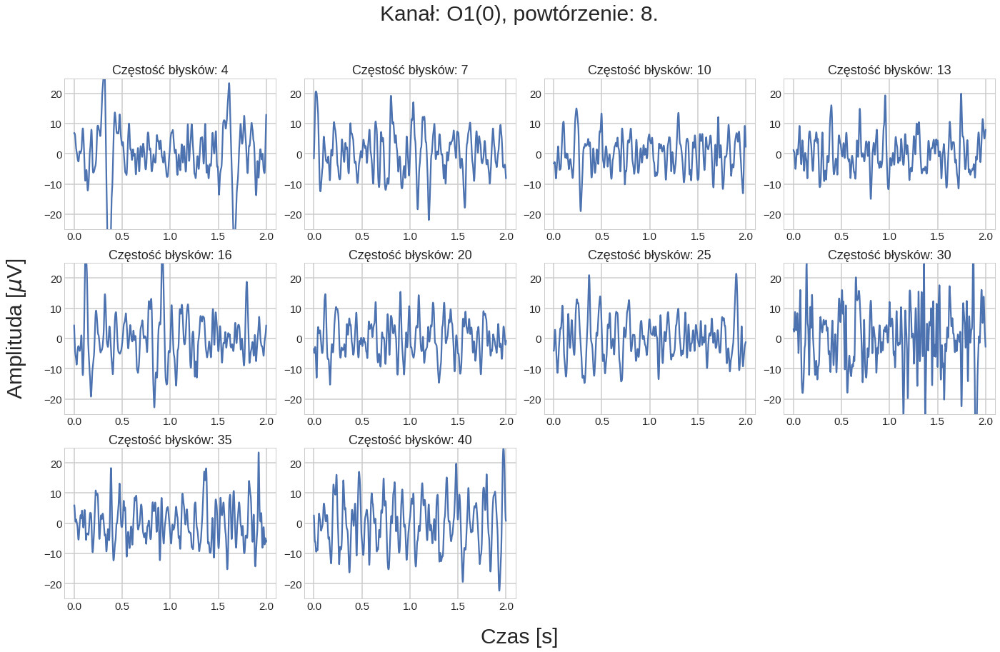

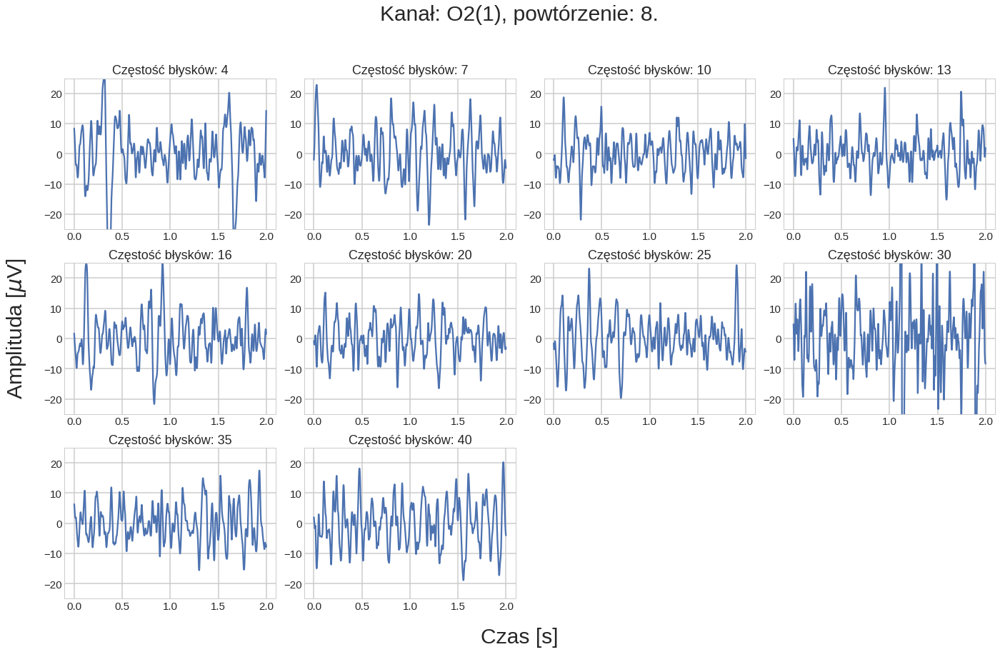

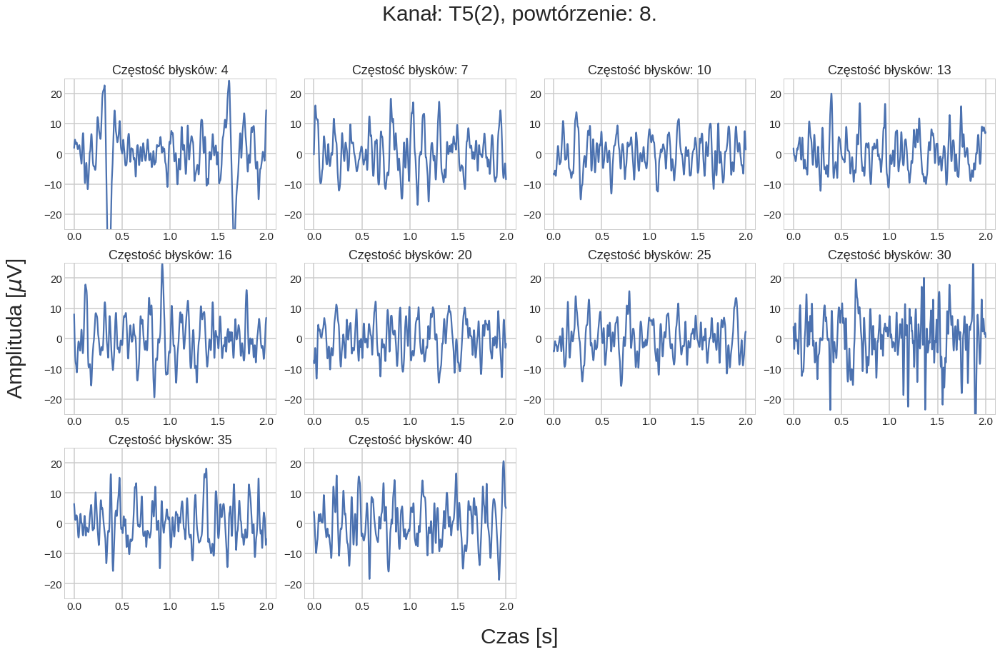

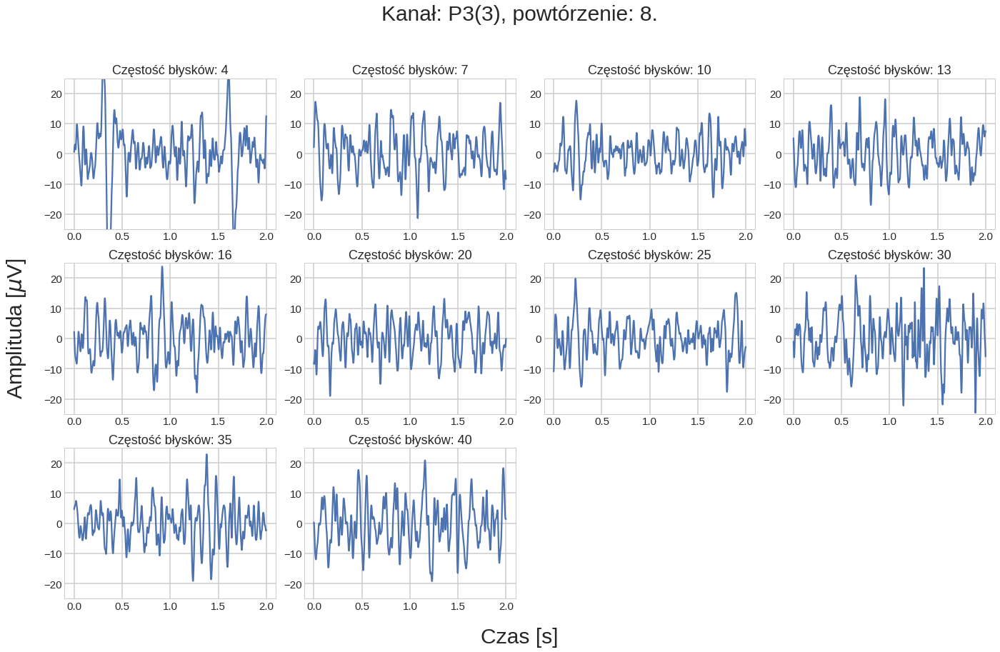

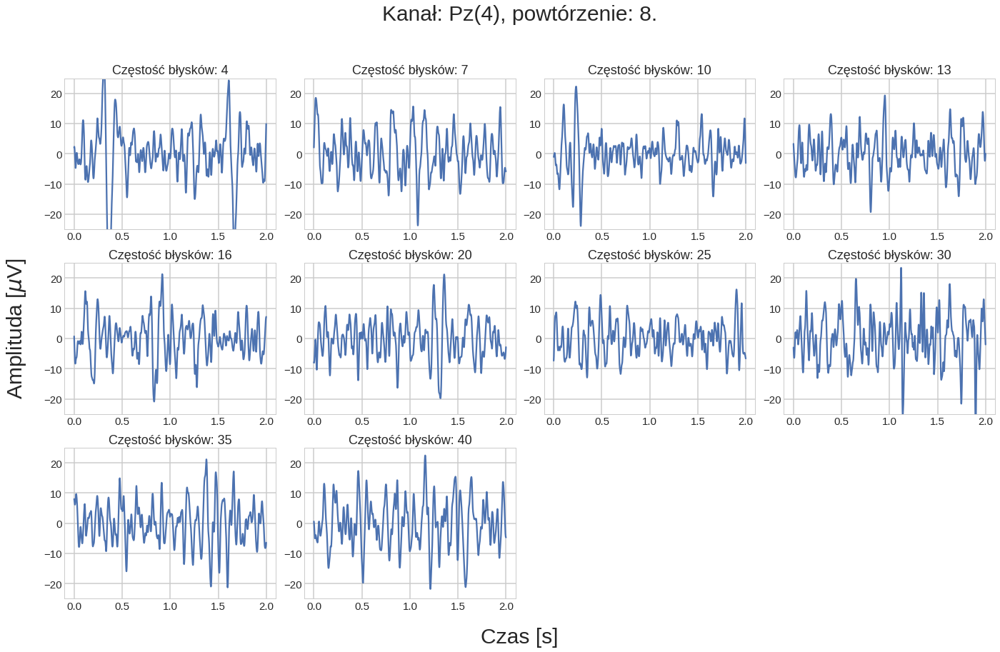

...

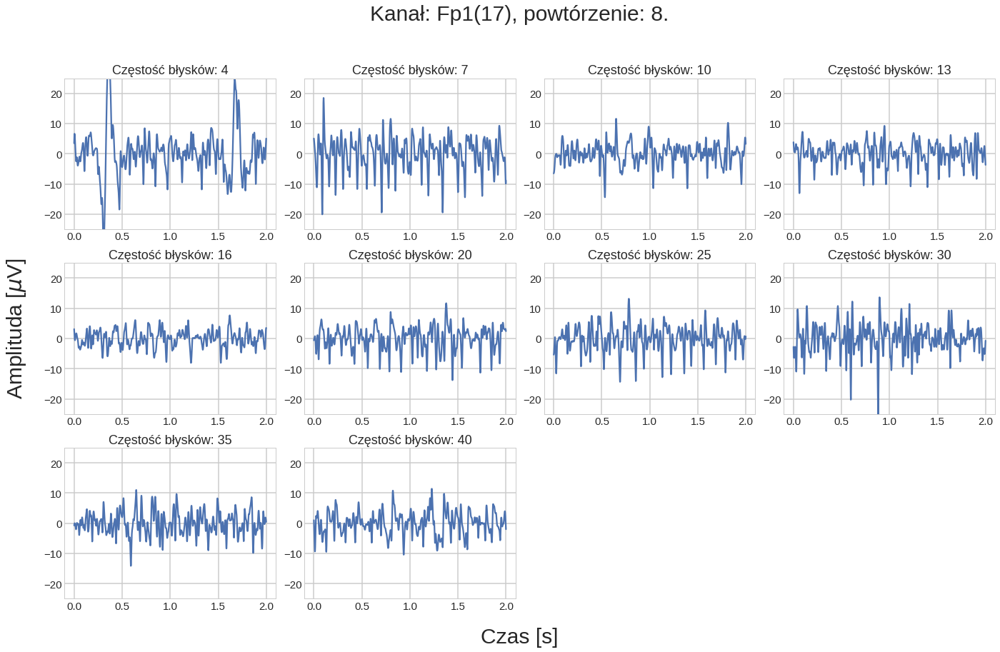

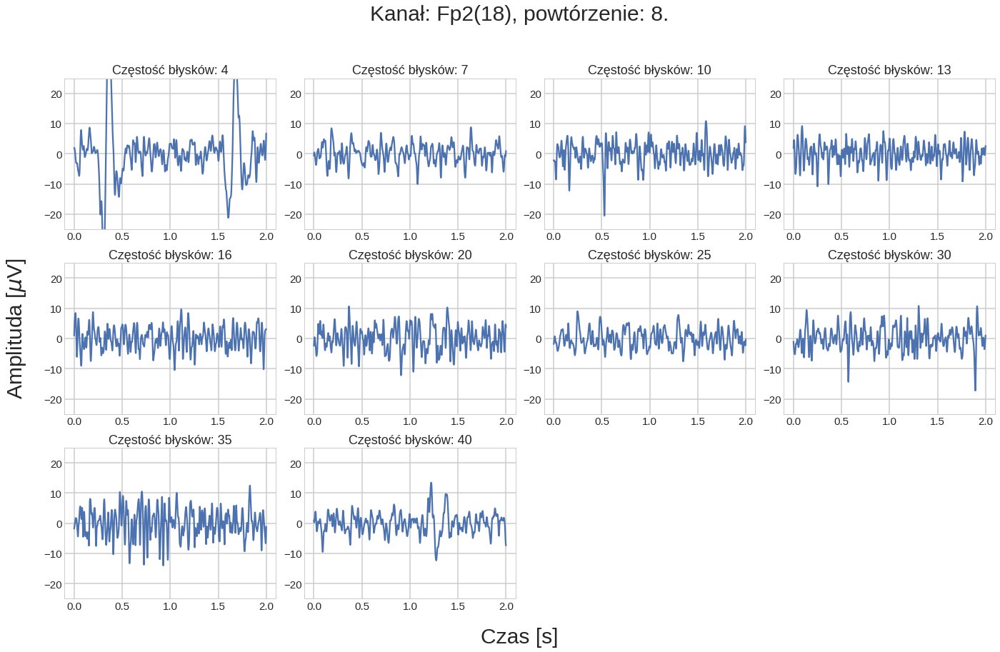

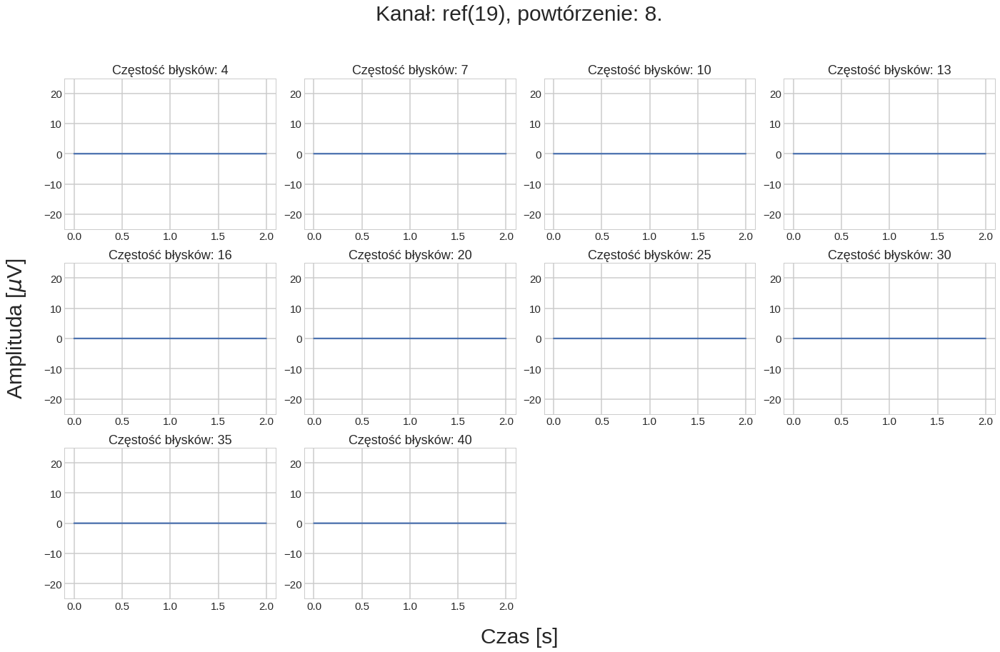

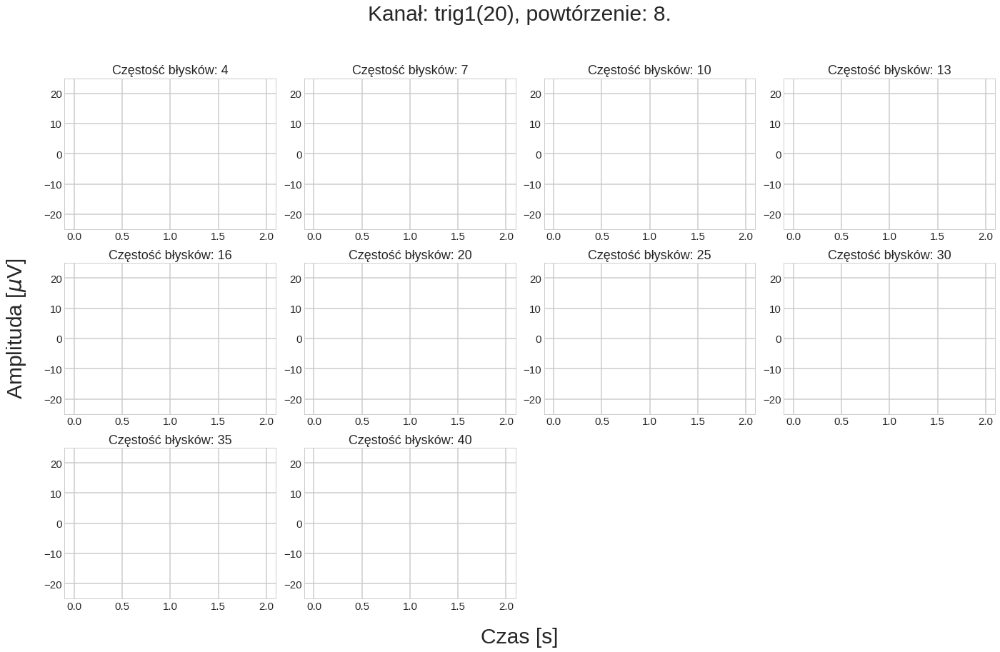

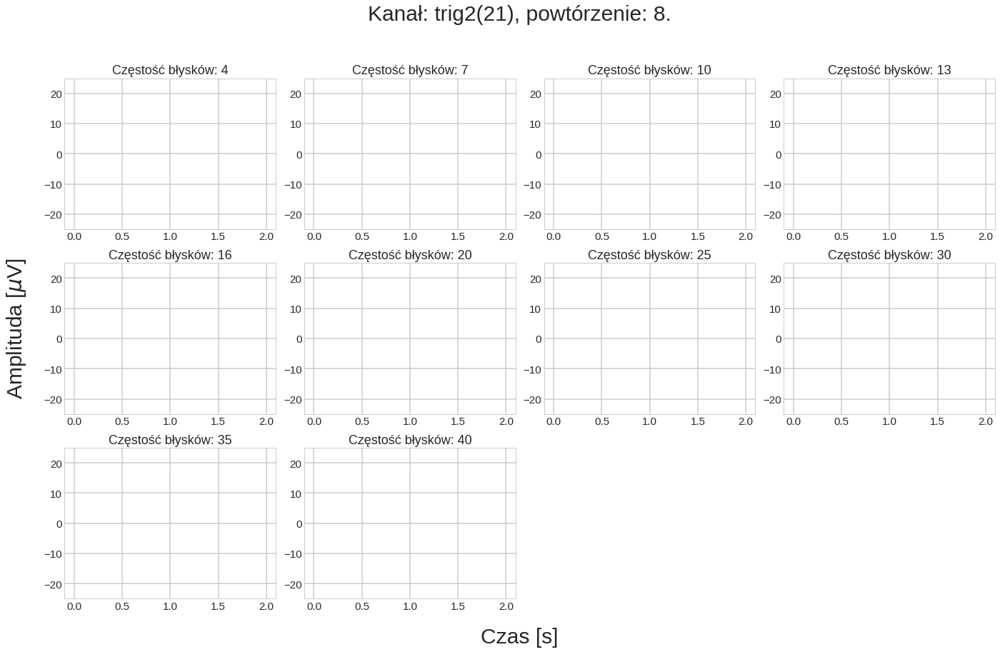

In [104]:
rep = 8
ranges = [0,2*Fs]
for ch, ch_name in enumerate(CH):
    fig = plt.figure(figsize = (20,17))
    fig.text(0.5, 0.25, 'Czas [s]', ha='center',fontsize=30)
    fig.text(0, 0.61, 'Amplituda [$\mu$V]', va='center', rotation='vertical',fontsize=30)
    plt.suptitle(f'Kanał: {ch_name}({ch}), powtórzenie: {rep}.', fontsize=30)
    plt.rc('axes', labelsize=16)
    plt.rc('axes', titlesize=18) 
    plt.rc('xtick', labelsize=15)    # fontsize of the tick labels
    plt.rc('ytick', labelsize=15) 
    for i, fragment in enumerate(sorted_reshaped_fragments[:,rep,ch,ranges[0]:ranges[1]]):
#         fragment = fragment[ranges[0]:ranges[1]]
        plt.subplot(4,4,i+1)
        plt.plot(np.arange(0,int(len(fragment)/Fs),1/Fs),fragment)
#         plt.xlim(2, 4)
        plt.ylim(-25, 25)
#         plt.xlabel('Czas [s]')
#         plt.ylabel('Amplituda [$\mu$V]')
        plt.title(f'Częstość błysków: {czestosci[i]}')
    plt.tight_layout(rect=[0.03, 0.08, 0.97, 0.92])
plt.show()

In [114]:
def set_subplot_params(figsize,xlabel,ylabel,title,axlabsize=16,axtitsize=18,xticksize=15,yticksize=15):
    fig = plt.figure(figsize = figsize)
    fig.text(xlabel[0],xlabel[1], xlabel[2], ha='center',fontsize=30)
    fig.text(ylabel[0],ylabel[1], ylabel[2], va='center', rotation='vertical',fontsize=30)
    plt.suptitle(title, fontsize=30)
    plt.rc('axes', labelsize=axlabsize)
    plt.rc('axes', titlesize=axtitsize) 
    plt.rc('xtick', labelsize=xticksize)    # fontsize of the tick labels
    plt.rc('ytick', labelsize=yticksize)
    plt.tight_layout(rect=[0.03, 0.08, 0.97, 0.92])

In [73]:
print(f'sorted_reshaped_fragments_4H: {sorted_reshaped_fragments_4H.shape} = (freq,rep,ch,sample)')
chosen_freqs = (1,2,6)
chosen_channels = (0,11,15)
chosen_rep = 8
fragments_to_be_hilberted = sorted_reshaped_fragments_4H[:,chosen_rep,chosen_channels,:]
fragments_to_be_hilberted = fragments_to_be_hilberted[chosen_freqs,:,:]
# fragments_to_be_hilberted = sorted_reshaped_fragments[1,8,0,:]
print(f'repetition: {chosen_rep}')
print(f'Fragments to be Hilberted: {fragments_to_be_hilberted.shape} = (({czestosci[1]}Hz, {czestosci[2]}Hz, {czestosci[6]}Hz), {CH[0],CH[11],CH[15]}, sample)')

sorted_reshaped_fragments_4H: (10, 30, 22, 9216) = (freq,rep,ch,sample)
repetition: 8
Fragments to be Hilberted: (3, 3, 9216) = ((7Hz, 10Hz, 25Hz), ('O1', 'T4', 'F4'), sample)


In [74]:
lfiltered_FTBH = np.zeros(fragments_to_be_hilberted.shape)
N=3
bw = 3
b7,a7 = ss.butter(N, [7-bw,7+bw], btype='bandpass',fs=Fs)
b10,a10 = ss.butter(N, [10-bw,10+bw], btype='bandpass',fs=Fs)
b25,a25 = ss.butter(N, [25-bw,25+bw], btype='bandpass',fs=Fs)
lfiltered_FTBH[0] = ss.lfilter(b7,a7,fragments_to_be_hilberted[0])
lfiltered_FTBH[1] = ss.lfilter(b10,a10,fragments_to_be_hilberted[1])
lfiltered_FTBH[2] = ss.lfilter(b25,a25,fragments_to_be_hilberted[2])
lfiltered_FTBH.shape

(3, 3, 9216)

In [75]:
filtfiltered_FTBH = np.zeros(fragments_to_be_hilberted.shape)
filtfiltered_FTBH[0] = ss.filtfilt(b7,a7,fragments_to_be_hilberted[0])
filtfiltered_FTBH[1] = ss.filtfilt(b10,a10,fragments_to_be_hilberted[1])
filtfiltered_FTBH[2] = ss.filtfilt(b25,a25,fragments_to_be_hilberted[2])
filtfiltered_FTBH.shape

(3, 3, 9216)

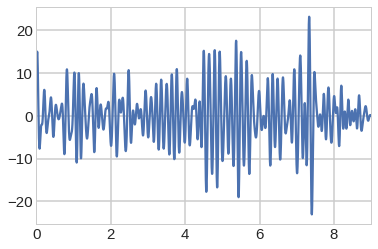

In [94]:
import matplotlib as mpl
time = np.arange(0,len(filtfiltered_FTBH[0,0,:])/Fs , 1/Fs)
duration_time = len(filtfiltered_FTBH[0,0,:])/Fs
stimulation_duration_time = (duration_time - 7,duration_time-2)
mpl.style.use('seaborn-whitegrid')
plt.plot(time,filtfiltered_FTBH[0,0,:])
plt.xlim(0,duration_time)
plt.show()

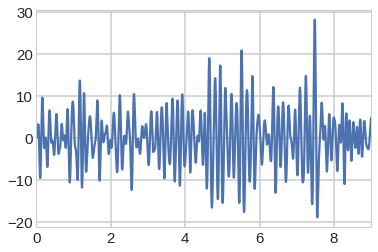

In [77]:
plt.plot(time,lfiltered_FTBH[0,0,:])
plt.xlim(0,duration_time)
plt.show()

In [78]:
lfil_hilbert = ss.hilbert(lfiltered_FTBH)
obw_lfil_hilbert = np.abs(lfil_hilbert)
linstantaneous_phase = np.unwrap(np.angle(lfil_hilbert))
linstantaneous_frequency = (np.diff(linstantaneous_phase) /(2.0*np.pi) * Fs)

filfil_hilbert = ss.hilbert(filtfiltered_FTBH)
obw_filfil_hilbert = np.abs(filfil_hilbert)
instantaneous_phase = np.unwrap(np.angle(filfil_hilbert))
instantaneous_frequency = (np.diff(instantaneous_phase) /(2.0*np.pi) * Fs)

In [79]:
obw_lfil_hilbert.shape

(3, 3, 9216)

/home/beatka/.local/lib/python3.7/site-packages/numpy/core/numeric.py:501: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


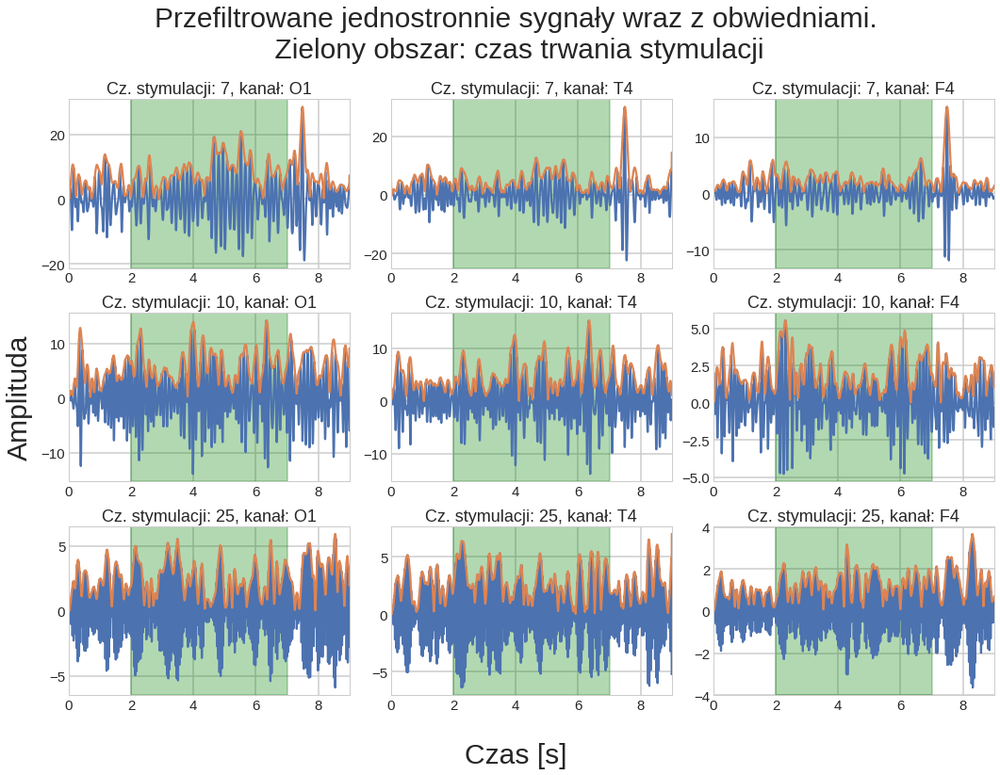

In [129]:
xlab = (0.5,0.05,"Czas [s]")
ylab = (0,0.5,"Amplituda")
stym_tit = "\n Zielony obszar: czas trwania stymulacji"
tit = "Przefiltrowane jednostronnie sygnały wraz z obwiedniami." + stym_tit
set_subplot_params((15,12),xlab,ylab,tit,axlabsize=16,axtitsize=18,xticksize=15,yticksize=15)
for ind,freq in enumerate(chosen_freqs):
    for jind,ch in enumerate(chosen_channels):
        plot_ind = len(chosen_freqs)*ind + jind + 1
        plt.subplot(len(chosen_freqs),len(chosen_channels),plot_ind)
        plt.title(f'Cz. stymulacji: {czestosci[freq]}, kanał: {CH[ch]}')
        plt.plot(time,lfil_hilbert[ind,jind,:])
        plt.plot(time,obw_lfil_hilbert[ind,jind,:])
        plt.axvspan(stimulation_duration_time[0], stimulation_duration_time[1],alpha=0.3, color='green')
        plt.xlim(0,duration_time)
plt.tight_layout(rect=[0.02, 0.1, 0.98, 0.9])
plt.show()

/home/beatka/.local/lib/python3.7/site-packages/numpy/core/numeric.py:501: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


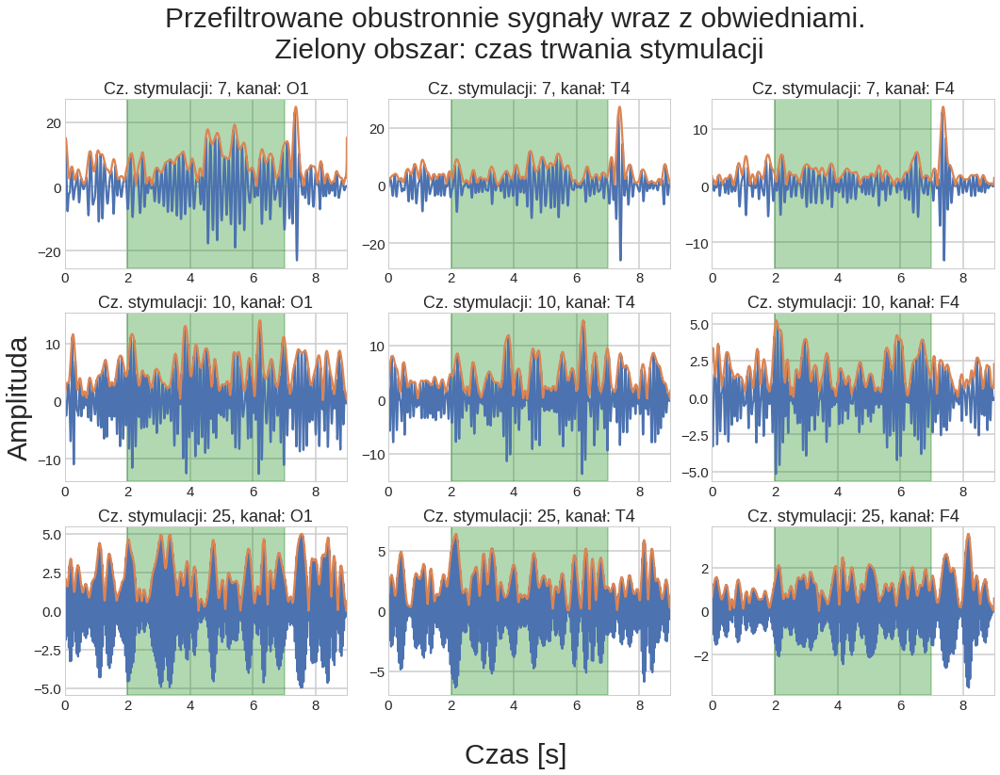

In [130]:
tit = "Przefiltrowane obustronnie sygnały wraz z obwiedniami." + stym_tit
set_subplot_params((15,12),xlab,ylab,tit,axlabsize=16,axtitsize=18,xticksize=15,yticksize=15)
for ind,freq in enumerate(chosen_freqs):
    for jind,ch in enumerate(chosen_channels):
        plot_ind = len(chosen_freqs)*ind + jind + 1
        plt.subplot(len(chosen_freqs),len(chosen_channels),plot_ind)
        plt.title(f'Cz. stymulacji: {czestosci[freq]}, kanał: {CH[ch]}')
        plt.plot(time,filfil_hilbert[ind,jind,:])
        plt.plot(time,obw_filfil_hilbert[ind,jind,:])
        plt.axvspan(stimulation_duration_time[0], stimulation_duration_time[1],alpha=0.3, color='green')
        plt.xlim(0,duration_time)
plt.tight_layout(rect=[0.02, 0.1, 0.98, 0.9])
plt.show()

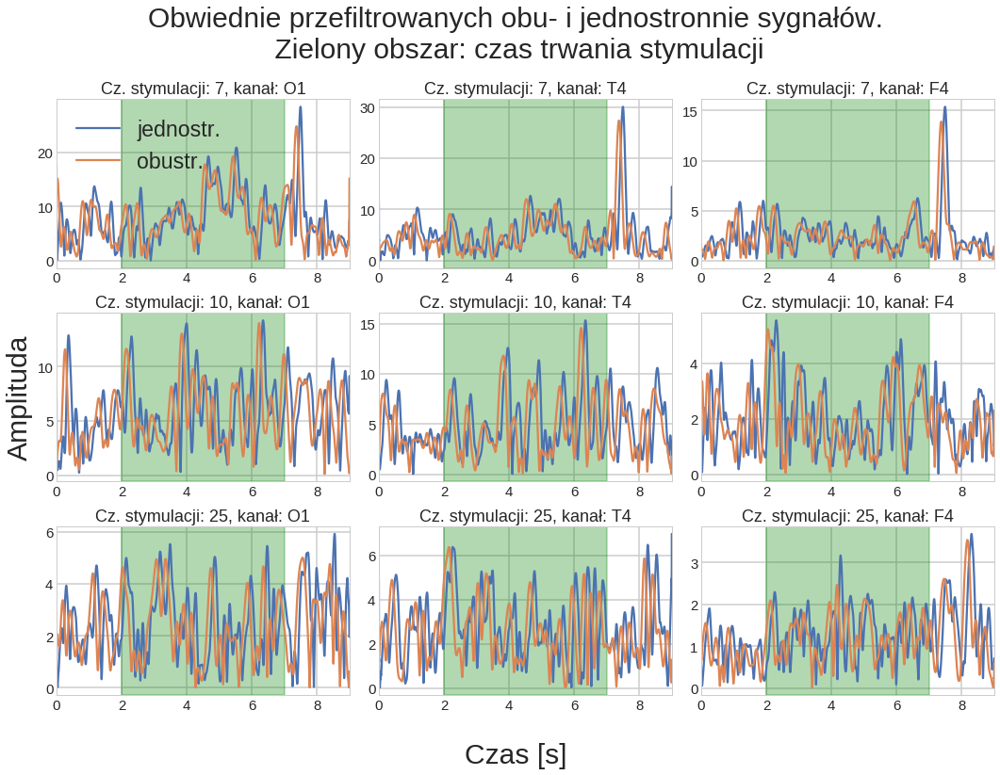

In [131]:
tit = "Obwiednie przefiltrowanych obu- i jednostronnie sygnałów." + stym_tit
set_subplot_params((15,12),xlab,ylab,tit,axlabsize=16,axtitsize=18,xticksize=15,yticksize=15)
for ind,freq in enumerate(chosen_freqs):
    for jind,ch in enumerate(chosen_channels):
        plot_ind = len(chosen_freqs)*ind + jind + 1
        plt.subplot(len(chosen_freqs),len(chosen_channels),plot_ind)
        plt.title(f'Cz. stymulacji: {czestosci[freq]}, kanał: {CH[ch]}')
        plt.plot(time,obw_lfil_hilbert[ind,jind,:],label='jednostr.')
        plt.plot(time,obw_filfil_hilbert[ind,jind,:],label='obustr.')
        plt.axvspan(stimulation_duration_time[0], stimulation_duration_time[1],alpha=0.3, color='green')
        plt.xlim(0,duration_time)
        if plot_ind == 1:
            plt.legend()
plt.tight_layout(rect=[0.02, 0.1, 0.98, 0.9])
plt.show()

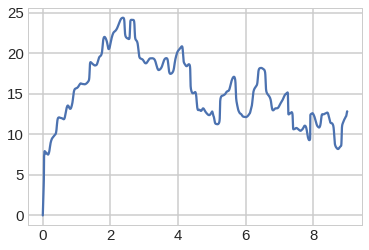

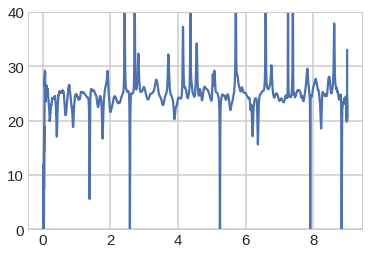

In [196]:
def sin(f, phi, Fs, T):
    t = np.arange(0,T,1/Fs)
    sinus = np.sin(2*np.pi*t*f + phi)
    return t, sinus

f = 25
T = 9
fs=Fs
t, sinus = sin(f, 0, fs, T)
s_hil = ss.hilbert(sinus)
faza1 = np.unwrap(np.angle(s_hil))
delta_faza = faza1-linstantaneous_phase[2,0,:]

plt.plot(t,delta_faza)
plt.show()
plt.plot(t[:-1],linstantaneous_frequency[2,0,:])
plt.ylim(0,40)
plt.show()

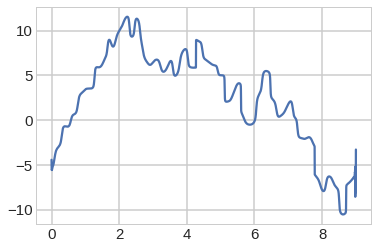

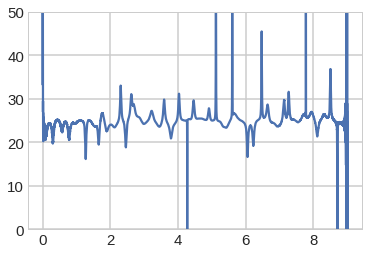

In [197]:
plt.plot(t,faza1-instantaneous_phase[2,0,:])
plt.show()
plt.plot(t[:-1],instantaneous_frequency[2,0,:])
plt.ylim(0,50)
plt.show()

In [198]:
(np.mean(instantaneous_frequency[2,0,:2*Fs]) + np.mean(instantaneous_frequency[2,0,7*Fs:]))/2

24.630344533502566

In [199]:
np.mean(instantaneous_frequency[2,0,2*Fs:7*Fs])

25.259430001063592